In [1]:
################ Prj set up ################ 
# set working diretory
prj = 'ScielzoC_1205_2D_3D_cell_line' 
PI = 'Scielzio'
setwd(paste("/Users/tascini.annasofia/Dropbox (HSR Global)/WORKSPACE/",
            PI,"/",prj,
            "/7_bioinfo/",
           sep=''))

In [2]:
################ load libraries ################ 
suppressMessages(library("edgeR"))
suppressMessages(library(data.table))
suppressMessages(library("DESeq2"))
suppressMessages(library(openxlsx))
suppressMessages(library(dplyr))
suppressMessages(library(ggplot2))
suppressMessages(library("RColorBrewer"))
suppressMessages(library(enrichR))
suppressMessages(library(grid))
suppressMessages(library(gridExtra))
suppressMessages(library('VennDiagram'))
suppressMessages(library(venn))
suppressMessages(library(cowplot))
suppressMessages(library(ggpubr))
suppressMessages(library("viridis"))
suppressMessages(library('pals'))
suppressMessages(library(RColorBrewer))
suppressMessages(library(wesanderson))
suppressMessages(library(patchwork))
suppressMessages(library(magick))
suppressMessages(library('philentropy'))
suppressMessages(library('IntClust'))
suppressMessages(library('pheatmap'))
suppressMessages(library(assertr))
suppressMessages(library("remotes"))
suppressMessages(library(GeneOverlap))
suppressMessages(library('stringr'))
suppressMessages(library(ggrepel))

Warning message:
“package ‘S4Vectors’ was built under R version 3.6.3”
Warning message:
“package ‘GenomeInfoDb’ was built under R version 3.6.3”
Warning message:
“package ‘DelayedArray’ was built under R version 3.6.3”


In [3]:
############## paths and replica #######################
# path to the count file
filecount = paste('/lustre1/workspace/Scielzo/ScielzoC_1205_2D_3D_cell_line/',
                  'samples/all/runs/all/fastq/merge-by-read/trimmed/trimmomatic/mapped/STAR/merged/featureCounts/merged/',
                  'all.counts.gz', sep='') 
# metadata
metadata_file =  paste(
                       '/lustre1/workspace/Scielzo/ScielzoC_1205_2D_3D_cell_line/',
                       'samples/metadata.tsv', sep='')

# Min number of replica in each group
Nreplica= 3

In [4]:
############## load data #########################
# import metadata
metadata = read.delim(metadata_file, header = T)

# import counts
annotation <- c('GeneID','Chr','Start','End','Strand','Length')
fCounts <- read.delim(file=filecount, header=TRUE, check.names = F)
fCountsData <- fCounts[
  , 
  -which(
    tolower(names(fCounts))
    %in% 
    tolower(annotation))]
         
fCountsAnnotation <- fCounts[
  , 
  which(
    tolower(names(fCounts))
    %in% 
      tolower(annotation))]

geneidColname <- 'Geneid'
geneidIdx <- which(tolower(annotation) %in% tolower(geneidColname))
rownames(fCountsData) <- fCounts[[geneidIdx]]

# Reordering counts matrix to have samples ordered as in metadata
# it assumes that the first column in metadata is sample name
fCountsData <- fCountsData[,match(metadata[,1], colnames(fCountsData))] 

In [5]:
############# biotypes ################
#BiocManager::install("GEOquery")
source('./plot-biotypes.R')
biotypesFile = paste('/lustre1/workspace/Scielzo/ScielzoC_1205_2D_3D_cell_line/',
                       'gencode.v31.basic.annotation.BIOTYPES.DICTIONARY.gz', sep='')
# also saved in new cluster in 
# /beegfs/scratch/ric.cosr/ric.scielzo/ScielzoC_1205_2D_3D_cell_line
biotypes_function(
  countsFile    = filecount,
  biotypesFile  = biotypesFile,
  pngFolder     = 'Biotypes/',
  minSamples    = 3,
  filterExp     = TRUE,
  useRpkm       = TRUE,
  plotPie       = TRUE,
  sglSamplePlot = TRUE,
  writeTable    = TRUE,
  perc2plot     = 0.001,
  useGgplot     = TRUE)

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



NULL

In [6]:
############# save counts in excel file: rawcount, filtered, cmp, rpkm ##############
SAVE_variable <- list()
filename_xls <- paste('COUNTS_',prj,'.xlsx', sep='')
variable2save_names <- c('all_counts', 'expGenes_counts','expGenes_LogCPM', 'expGenes_LogRPKM')

# all_counts
y <- DGEList(counts=fCountsData, genes = fCountsAnnotation)
SAVE_variable[[variable2save_names[1]]] <- as.data.frame(y$counts)

# expGENES_counts
keep <- rowSums(cpm(y)>1)>=Nreplica
table(keep)
yf <- y[keep,]
SAVE_variable[[variable2save_names[2]]] <- as.data.frame(yf$counts)


#CPM
SAVE_variable[[variable2save_names[3]]] <- as.data.frame(cpm(yf, log=T))

#RPKM
SAVE_variable[[variable2save_names[4]]] <- as.data.frame(rpkm(yf, log=T, gene.length =yf$genes$Length))

write.xlsx(SAVE_variable,
           file = filename_xls, 
           row.names = T,
           asTable = T, 
           sheetName =variable2save_names)

keep
FALSE  TRUE 
45587 13463 

In [7]:
#### 500 most variant genes ############
y <- DGEList(counts=fCountsData, genes = fCountsAnnotation)
# rpkm
fCountsRPKM = rpkm(y, log=T, gene.length =y$genes$Length)
# filter for expression
keep <- rowSums(cpm(y)>1)>=Nreplica
yf <- y[keep,]

# calculate 500 most variant genes and 
# save their counts in fCountsRPKMTOP
N=500
vary <- apply(fCountsRPKM[keep,],1,var)
vary_s <- sort(vary, decreasing = T)
TOP_N <- names(vary_s[1:N])
yTOP <-  y[TOP_N,]
fCountsRPKMTOP <- fCountsRPKM[TOP_N,]

In [8]:
######### control genes ############
gene_control_file = paste(
                          '/lustre2/scratch/bioinfotree/common/bioinfotree/prj/',
                          'MalteccaF_926_Corteccia_Ippocampo/local/share/data/',
                          'standard.controls.hsapiens.txt', sep='')
gene_control = read.table(gene_control_file)
gene_control.r = as.character(gene_control$V1)
rpkm.control = fCountsRPKM[which(rownames(fCountsRPKM) %in% gene_control.r),]
#### heatmap control genes
colors <- colorRampPalette( rev(brewer.pal(11, "RdYlBu")) )(255)
crp <- colorRampPalette(c('dodgerblue4','white','darkred'))
colors = crp(255)
pheatmap::pheatmap(rpkm.control,
                   cluster_rows = F,
                   cluster_cols = F,
                   main = 'Heatmap of housekeeping genes - RPKM',
                   show_rownames = T,
                   show_columnames = F,
                   fontsize = 12, fontsize_row = 10, fontsize_col = 14, 
                   display_numbers = F, 
                   col=colors,
                   filename = 'Heatmap_controlGenes.pdf',
                    width = 10, height = 7)

In [9]:
########### explorative PCA plots ##########
#PCA parameters
pcx = 1
pcy = 2
centering = TRUE
scaling = TRUE
# PCA
pca = prcomp(t(fCountsRPKMTOP), center=centering, scale=scaling)
var = round(matrix(((pca$sdev^2)/(sum(pca$sdev^2))), ncol=1)*100,1)
score = as.data.frame(pca$x)

# plot paramters
xlab = paste("PC", pcx, " (",var[pcx],"%)", sep="")
ylab = paste("PC", pcy, " (",var[pcy],"%)", sep="")
cum = var[pcx]+var[pcy]
names = rownames(pca$x)


#plot
pca_plot <- list()

i=0
for (col in 2:dim(metadata)[2]) {
    score$factor <-  metadata[,col]
    i=i+1
    pca_plot[[i]] <- ggplot(score, aes(x=score[,pcx], y=score[,pcy], color=factor))+
    geom_point(size=5)+
    labs(x=xlab, y=ylab, title=paste("PC",pcx," vs PC",pcy," scoreplot",sep="")) + 
            geom_hline(yintercept=0, linetype="dashed", color = "darkgrey") +
            geom_vline(xintercept=0, linetype="dashed", color = "darkgrey") +
    theme(plot.title = element_text(color="black", size=26, face="bold.italic"),
      axis.text.x = element_text(angle = 0, face = "bold", color = "black", size=22, hjust =.5), 
      axis.title.x = element_text(face = "bold", color = "black", size = 24),
      axis.text.y = element_text(angle = 0, face = "bold", color = "black", size=22),
      axis.title.y = element_text(face = "bold", color = "black", size = 24),
      legend.text = element_text(face = "bold", color = "black", size = 16),
      legend.position="right",
      panel.background = element_rect(fill = "white",colour = "black", size = 1, linetype = "solid")) 
}

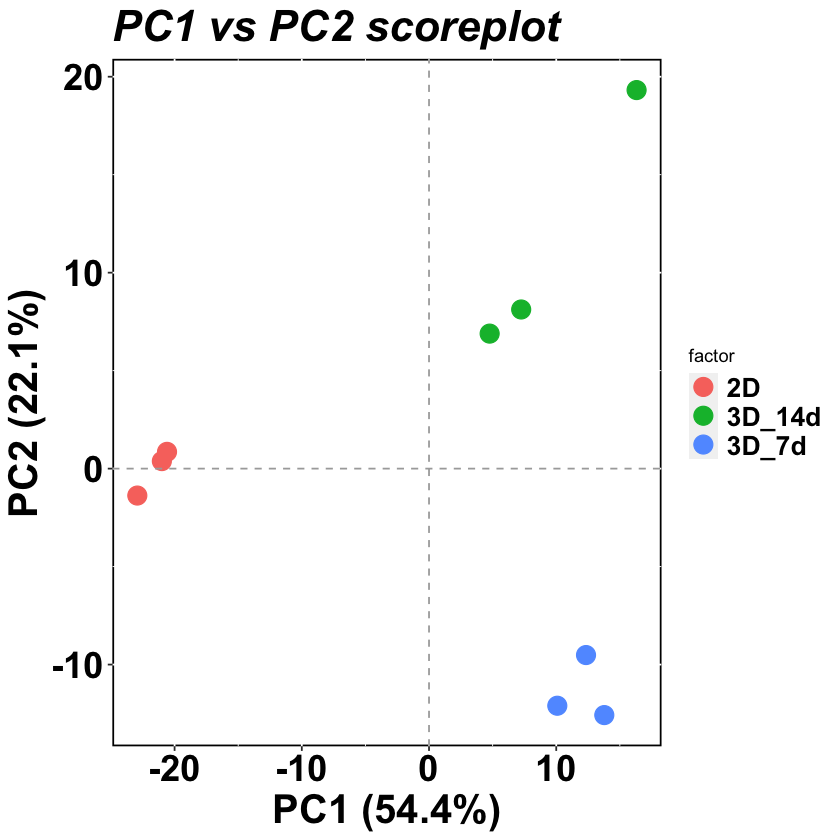

[[1]]

[[2]]

[[3]]


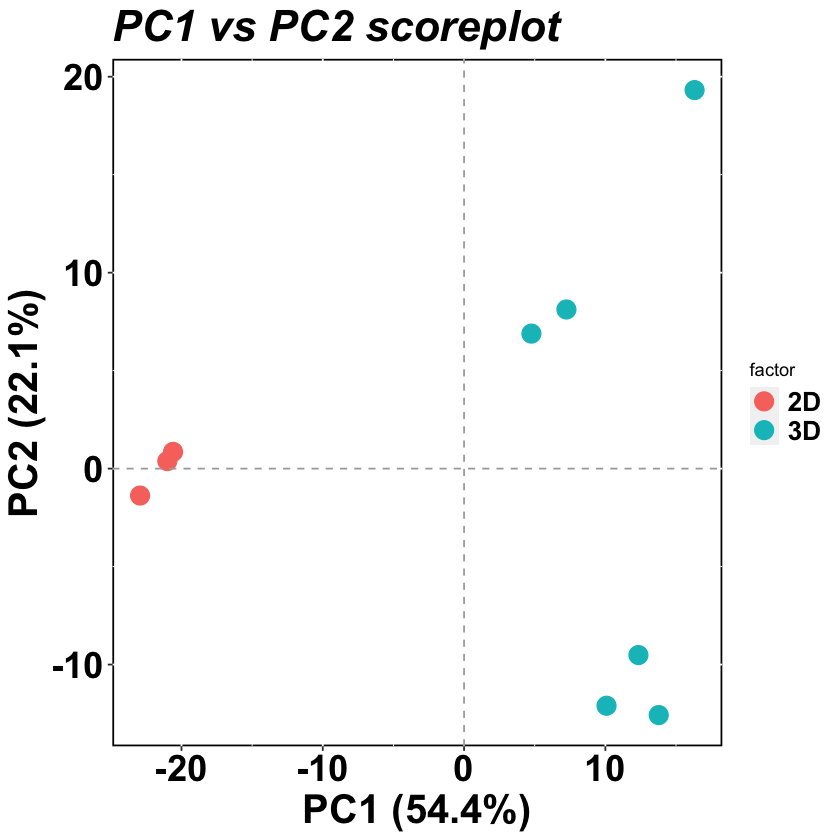

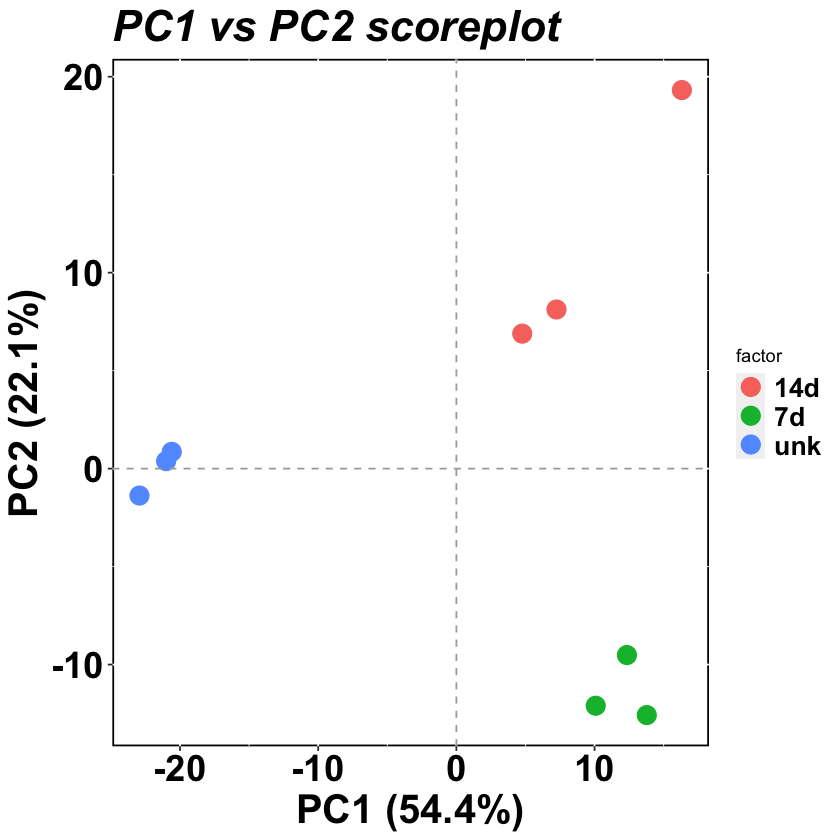

In [10]:
pca_plot

In [11]:
############## rescale metadata factors #############
metadata$condition = as.factor(metadata$condition)
metadata$condition = factor(metadata$condition, levels = c('2D','3D_7d','3D_14d'))
metadata$Dim = as.factor(metadata$Dim)
metadata$time = as.factor(metadata$time)
metadata$time = factor(metadata$time, levels = c('unk','7d','14d') )                          

pdf 
  2

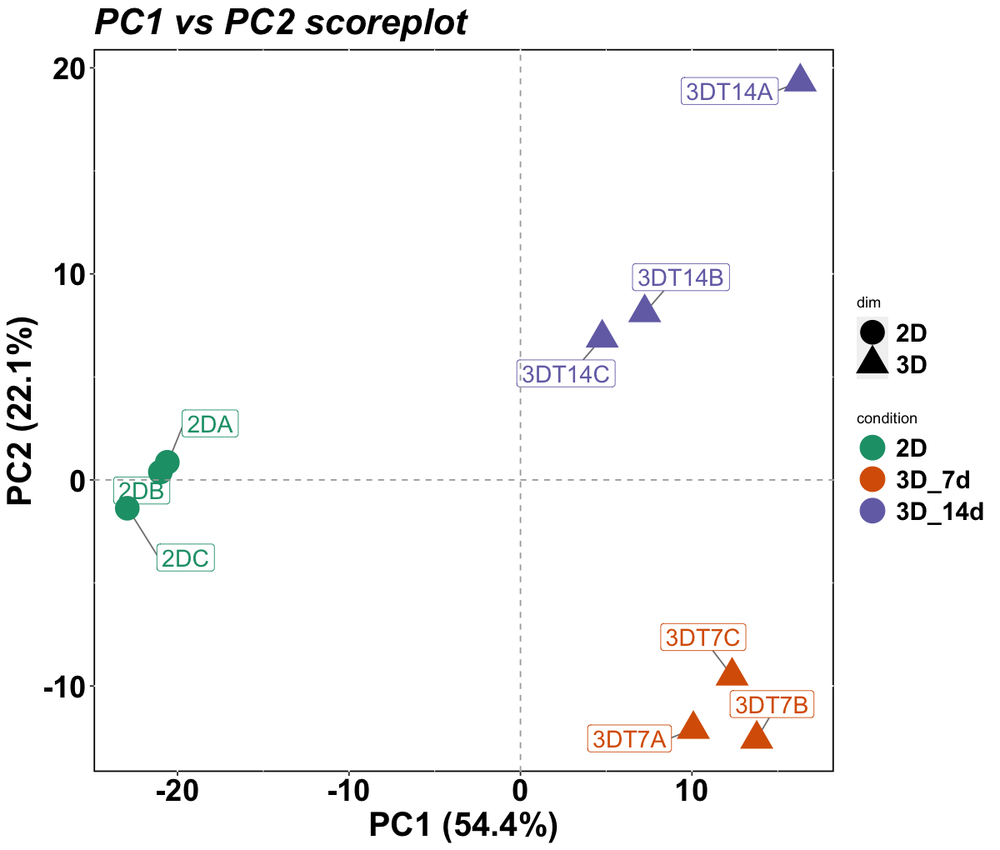

In [12]:
########### PCA plot for report ##########
score$condition = metadata$condition
score$dim = metadata$Dim
score$time = metadata$time
score$sampleID = metadata$SampleID
#stringr::str_wrap(V1, 15)

pca<- ggplot(score, aes(x=score[,pcx], y=score[,pcy], 
                        color=condition, shape = dim))+
geom_label_repel(data= score, aes(x=score[,pcx], y=score[,pcy], 
                        color=condition, label = str_sub(x <- sampleID,7,-1)),
                 size = 6,  box.padding = unit(1, "lines"), point.padding = unit(0.1, "lines"),
                 segment.color = 'grey50') +
geom_point(size= 8)+
labs(x=xlab, y=ylab, title=paste("PC",pcx," vs PC",pcy," scoreplot",sep="")) + 
            geom_hline(yintercept=0, linetype="dashed", color = "darkgrey") +
            geom_vline(xintercept=0, linetype="dashed", color = "darkgrey") +
theme(plot.title = element_text(color="black", size=26, face="bold.italic"),
      axis.text.x = element_text(angle = 0, face = "bold", color = "black", size=22, hjust =.5), 
      axis.title.x = element_text(face = "bold", color = "black", size = 24),
      axis.text.y = element_text(angle = 0, face = "bold", color = "black", size=22),
      axis.title.y = element_text(face = "bold", color = "black", size = 24),
      legend.text = element_text(face = "bold", color = "black", size = 18),
      legend.position="right", 
      panel.background = element_rect(fill = "white",colour = "black", size = 1, linetype = "solid")) +
scale_color_manual(values = brewer.pal(n = 3, name = "Dark2"))  

options(repr.plot.width=10, repr.plot.height=8.5)
pca
pdf('PCA_top500rpkm.pdf', width = 10, height = 8.5)
pca
dev.off()

In [13]:
############### Heatmap for report ###################
annotation_column <- metadata[,2:(dim(metadata)[2])]

mycolors_c <- brewer.pal(n = 3, name = "Dark2");     names(mycolors_c) = levels(annotation_column$condition)
mycolors_b <- rev(viridis(2)) ; names(mycolors_b) = levels(annotation_column$Dim)
mycolors_I <- brewer.pal(n = 3, name = "Blues") ; names(mycolors_I) = levels(annotation_column$time)


ann_colors = list(
    condition = mycolors_c,
    Dim = mycolors_b,
    time = mycolors_I
)

row.names(annotation_column) <- metadata[,1]
#annotation_column = annotation_column[,c('condition','H2O2','APEX','Treatment','Differentiation')]
options(repr.plot.width=12, repr.plot.height=10)

#colors <- colorRampPalette( rev(brewer.pal(11, "RdYlBu")) )(255)
#colors = magma(255)
crp <- colorRampPalette(c('dodgerblue4','white','darkred'))
colors = crp(255)

annotation_column = annotation_column[,c("condition","Dim")]

HP <- pheatmap::pheatmap(fCountsRPKMTOP,
                         scale = 'row',
                         annotation_col = annotation_column,
                         annotation_colors = ann_colors, 
                         cluster_rows = T, 
                         cluster_cols = T,                       
                         #main = 'Heatmap: 500 most variable genes - RPKM',
                         show_rownames = F,
                         #cutree_rows = 3,
                         cutree_cols = 3,
                         fontsize = 12, fontsize_row = 10, fontsize_col = 14, 
                         display_numbers = F, 
                         col=colors,
                        filename = 'Heatmap_500rpkm.pdf',
                        width = 10, height = 8.5)



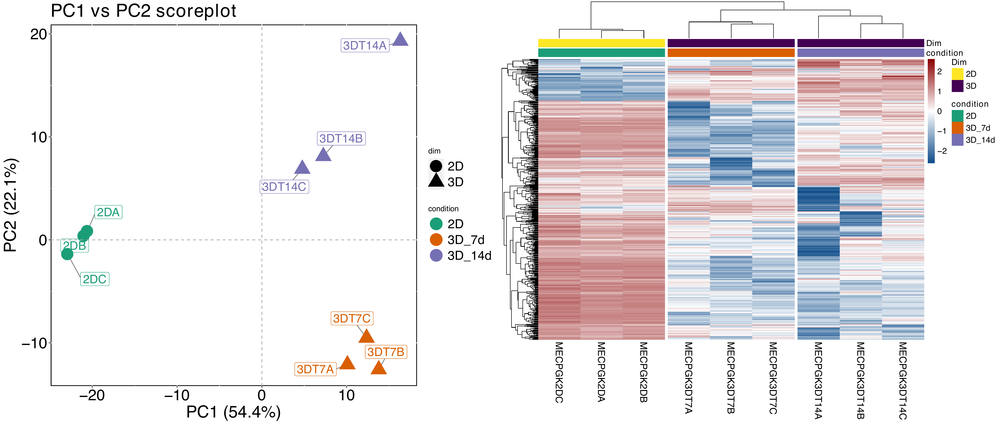

# A tibble: 1 x 7
  format width height colorspace matte filesize density
  <chr>  <int>  <int> <chr>      <lgl>    <int> <chr>  
1 PNG     4000   1700 sRGB       TRUE         0 200x200

In [14]:
########### combine PCA and heatmap plots #############
A1 <- image_read_pdf('PCA_top500rpkm.pdf', density = 200)
A2 <- image_read_pdf('Heatmap_500rpkm.pdf', density = 200)
im = image_append(c(A1, A2))
im
image_write(im, path = "Clustering_composite.tiff", format = "tiff")

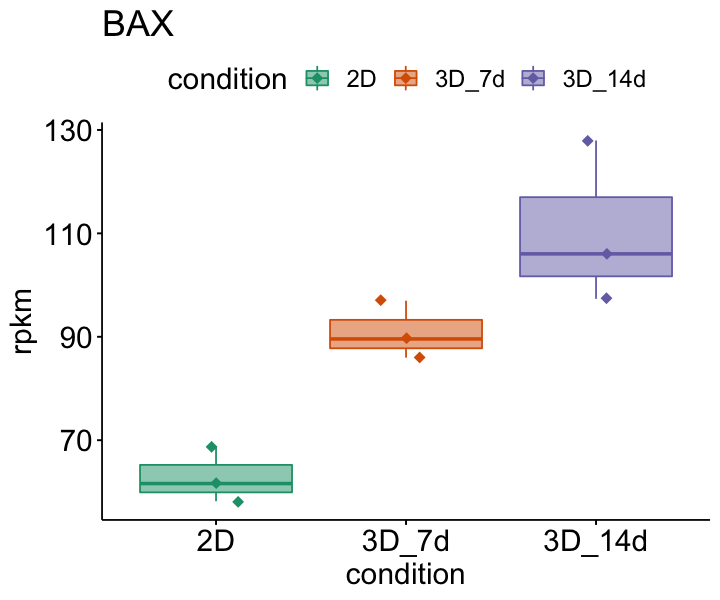

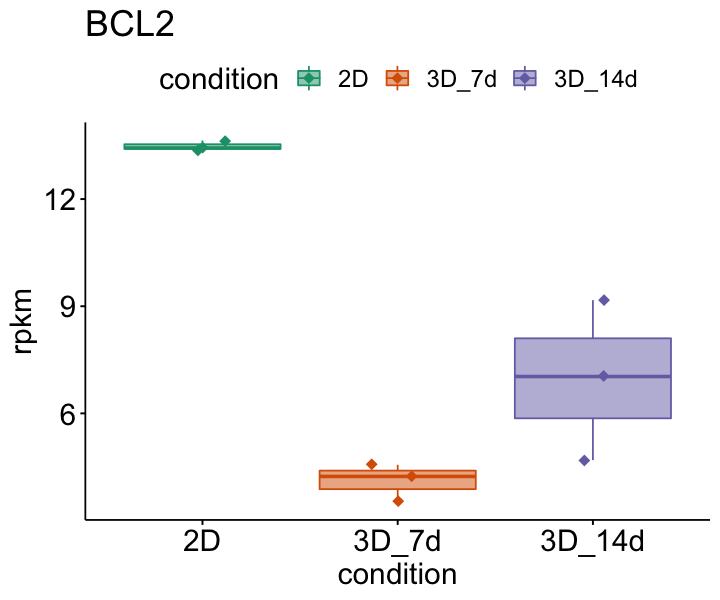

In [15]:
################ box plots of gene expression 1 ######################## 
g = c('BAX','BCL2')
df = metadata
y <- DGEList(counts=fCountsData, genes = fCountsAnnotation)
my_comparisons <- list( c("3D_7d", "2D"), c("3D_14d", "3D_7d"), c("3D_7d", "2D") )
frpkm <- rpkm(y, gene.length = y$genes$Length)
for (gene in g) {
    df$rpkm = frpkm[gene,]
    row.names(df) <- df$SampleID
    df$ID = as.character(1:length(metadata$SampleID))
    #df$condition = factor(df$condition, c('EV', 'DUX4', 'IGH', 'delta50'))    
    p <- ggboxplot(df, x = "condition", y = "rpkm", 
                   fill = "condition", color = "condition", width = 0.8,
                   add = c('jitter'), add.params = list(size =3, shape = 18),
                   alpha = 0.5, palette = mycolors_c,
                   short.panel.labs = FALSE, title = gene, 
                   font = list(size = 16, face = 'bold', color = "black")) + 
    theme(text = element_text(size=18))
    #p + stat_compare_means(label = "p.signif",  label.x = 1.5, label.y = .75)
    options(repr.plot.width=6, repr.plot.height=5)
    print(p)
    assign(paste('p',gene,sep='_'),
           p) 
    pdf(paste('boxplot_gene_',gene,'.pdf',sep=''), width = 6, height = 5)
    print(p)
    dev.off()
    
}

Warning message in dir.create(dir, recursive = TRUE):
“'qPCR' already exists”


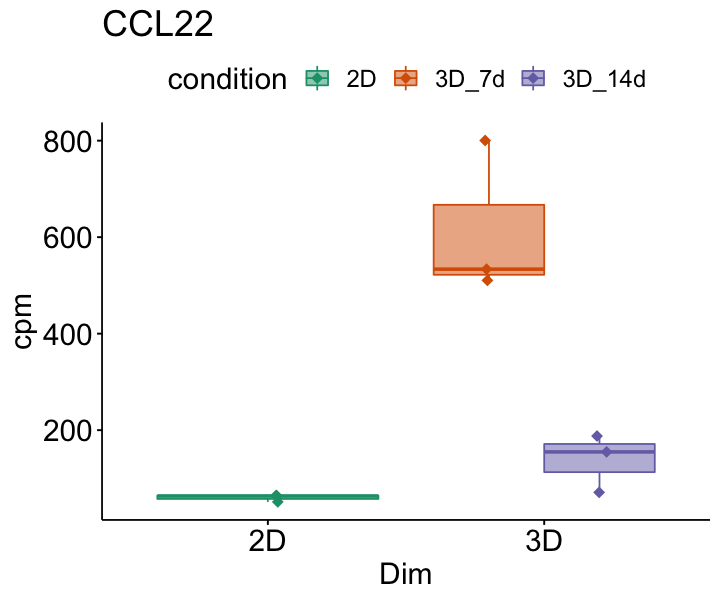

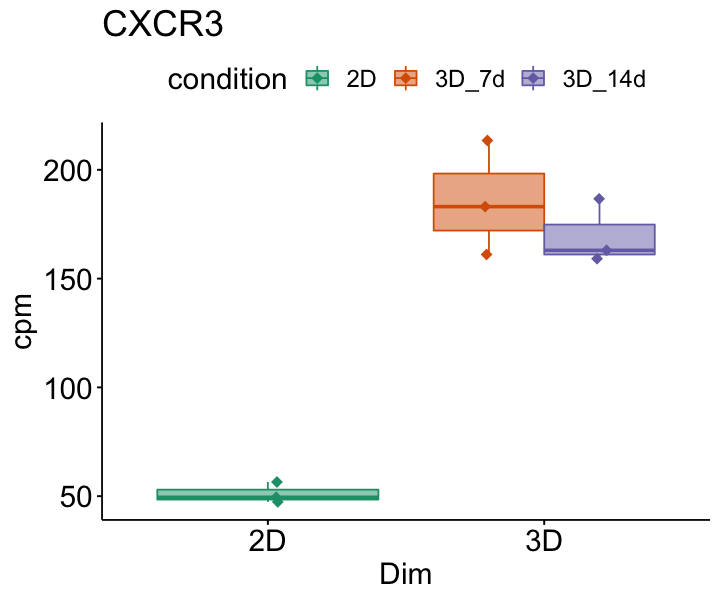

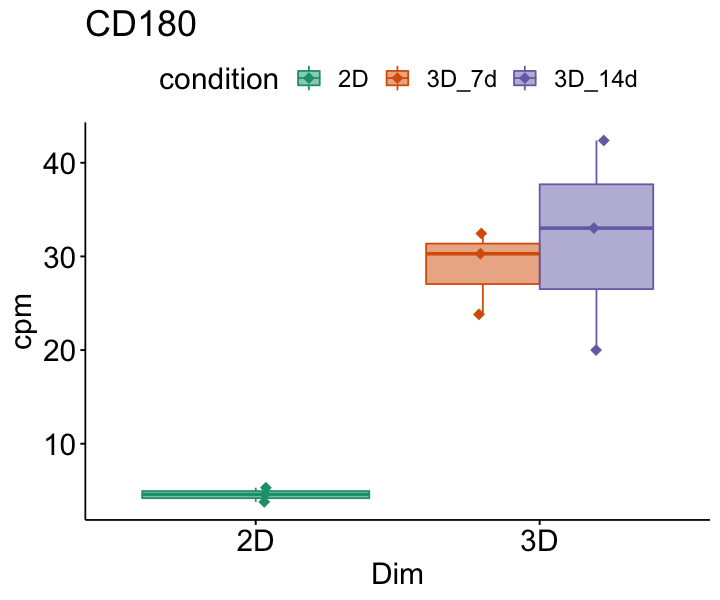

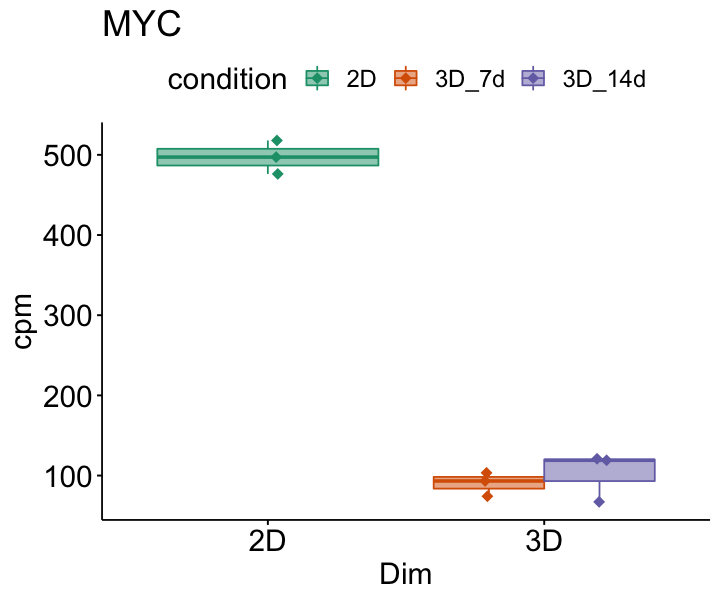

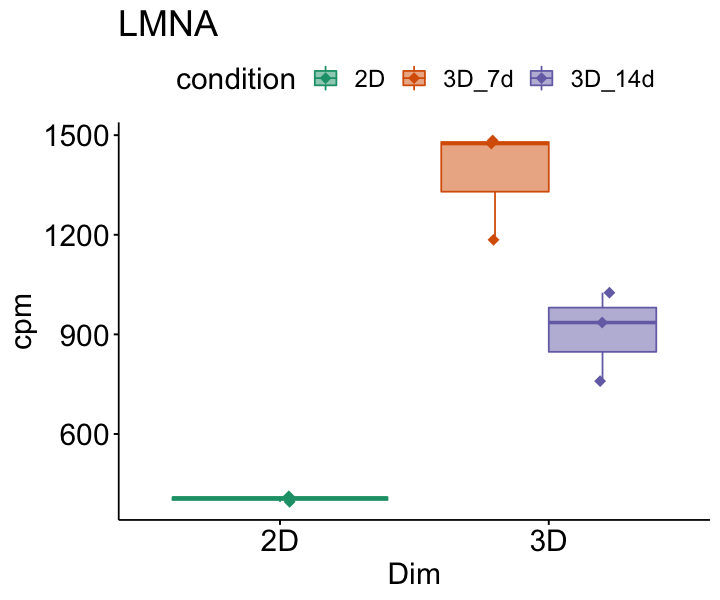

...

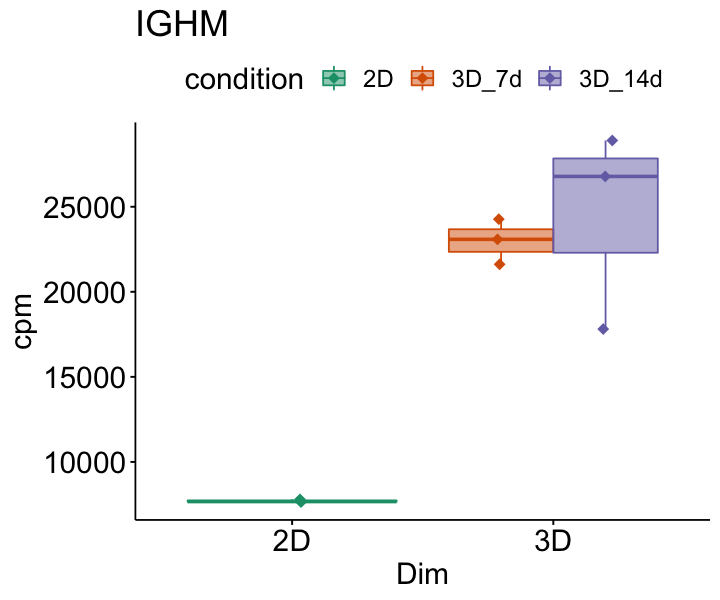

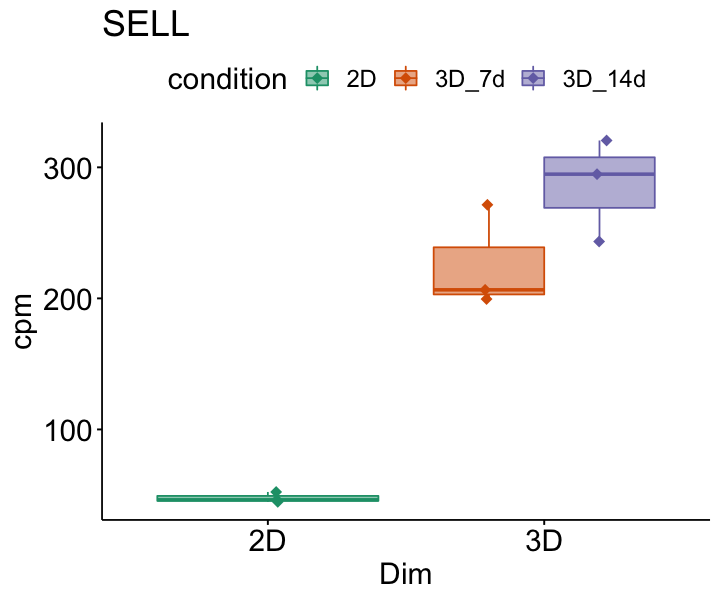

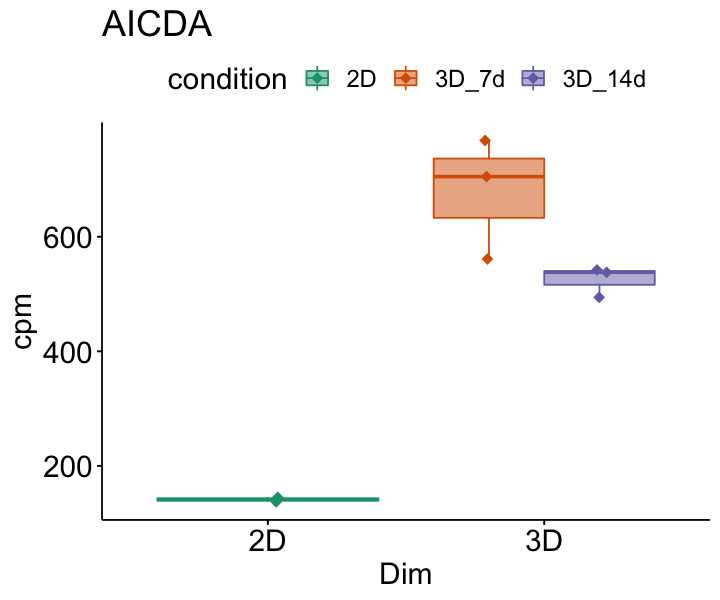

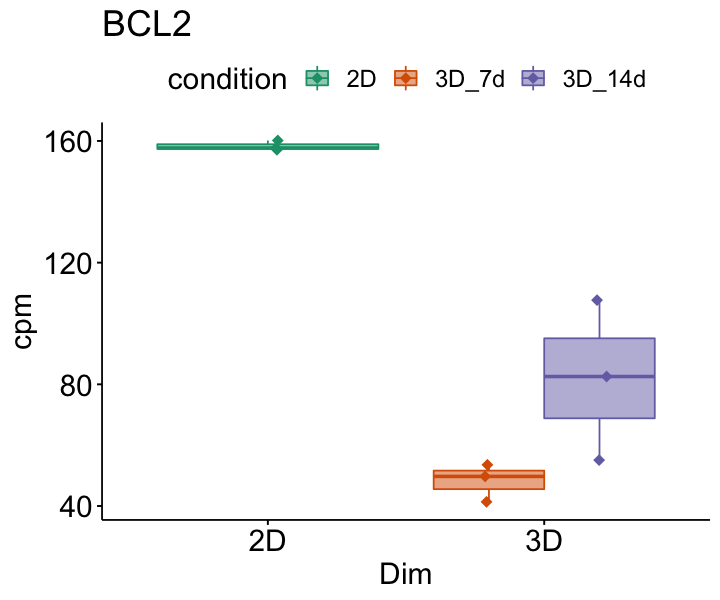

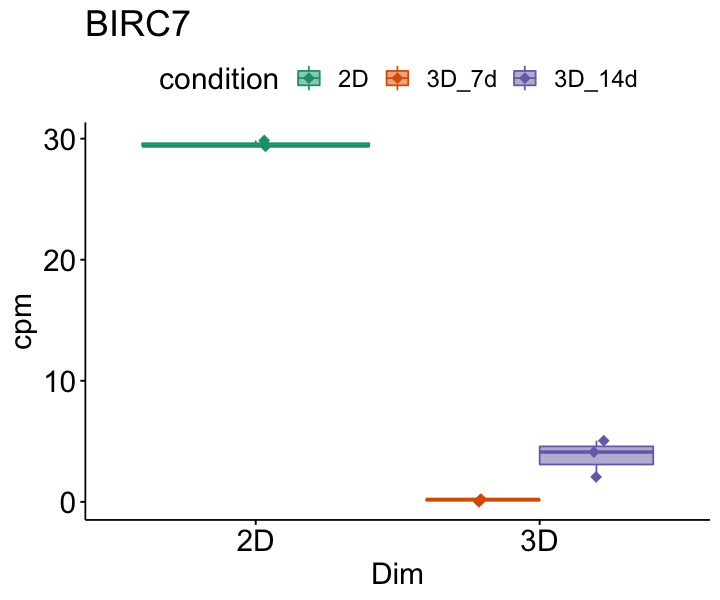

In [16]:
################ box plots of gene expression 2 ######################## 
g = c("CCL22" ,
"CXCR3",
"CD180",
"MYC",
"LMNA",
"HCLS1",
"PIM3",
"IGHM",
"SELL",
"AICDA",
"BCL2",
"BIRC7")

dir= 'qPCR/'
dir.create(dir, recursive = TRUE)

df = metadata
y <- DGEList(counts=fCountsData, genes = fCountsAnnotation)
my_comparisons <- list( c("3D_7d", "2D"), c("3D_14d", "3D_7d"), c("3D_7d", "2D") )
frpkm <- rpkm(y, gene.length = y$genes$Length)
fcpm <- cpm(y)
Ncounts <- y$counts
for (gene in g) {
    df$rpkm = frpkm[gene,]
    df$cpm = fcpm[gene,]
    df$counts = Ncounts[gene,]
    row.names(df) <- df$SampleID
    df$ID = as.character(1:length(metadata$SampleID))
    #df$condition = factor(df$condition, c('EV', 'DUX4', 'IGH', 'delta50'))    
    p <- ggboxplot(df, x = "Dim", y = "cpm", 
                   fill = "condition", color = "condition", width = 0.8,
                   add = c('jitter'), add.params = list(size =3, shape = 18),
                   alpha = 0.5, palette = mycolors_c,
                   short.panel.labs = FALSE, title = gene, 
                   font = list(size = 16, face = 'bold', color = "black")) + 
    theme(text = element_text(size=18))
    #p + stat_compare_means(label = "p.signif",  label.x = 1.5, label.y = .75)
    options(repr.plot.width=6, repr.plot.height=5)
    print(p)
    assign(paste('p',gene,sep='_'),
           p) 
    pdf(paste(dir,'boxplot_gene_',gene,'.pdf',sep=''), width = 5, height = 5)
    print(p)
    dev.off()
    
}

filter
FALSE  TRUE 
45587 13463 

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



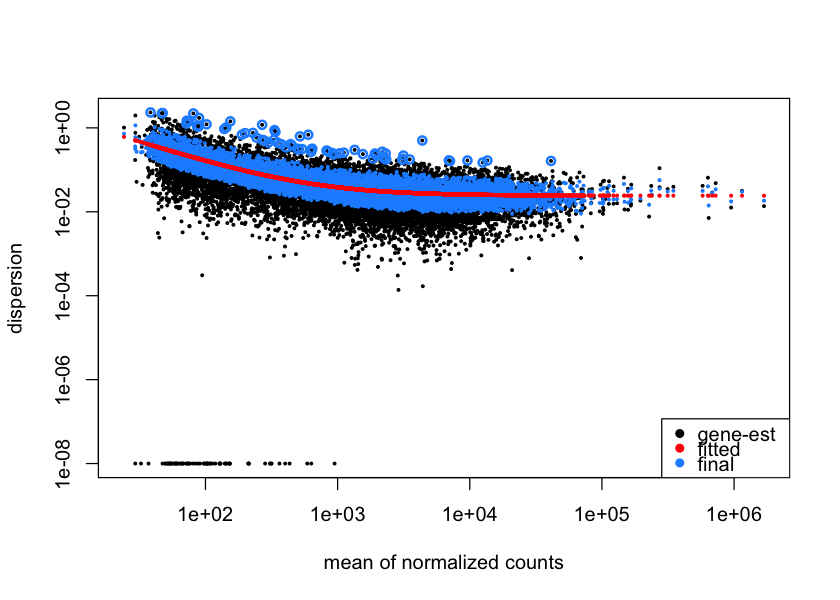

In [17]:
################ DGE - DESeq object ######################## 
dds <- DESeqDataSetFromMatrix(
    countData = fCountsData,
    colData  = metadata,
    design   = as.formula('~condition'))

filter <- rowSums(cpm(counts(dds)) >= 1) >= Nreplica
table(filter)
ddsFiltered <- dds[filter,]

#ddsFiltered[['condition']] <- relevel(
#  ddsFiltered[['condition']] , ref = 'EV')

dga <- DESeq(
  object = ddsFiltered,
  test = "Wald",
  fitType = "parametric",
  betaPrior = FALSE,
  minReplicatesForReplace = Inf)

options(repr.plot.width=7, repr.plot.height=5)
plotDispEsts(dga)

In [18]:
################ DGE - comparisons ######################## 
contrasts = resultsNames(dga)[- which(resultsNames(dga) %in% 'Intercept')]
alpha = 0.05

dgeResults <- list()
for (contrast in contrasts) {
    dgeResults[[contrast]] <- results(
        dga,
        name                 = contrast,
        cooksCutoff          = Inf,
        independentFiltering = TRUE,
        alpha                = alpha,
        pAdjustMethod        = "BH")
    print(summary(dgeResults[[contrast]]))
  # sorting gene list according to significance
  dgeResults[[contrast]] <- dgeResults[[contrast]][order(dgeResults[[contrast]]$pvalue, decreasing = F),]
}

# add additional comparison
v = "condition"
c1 = "3D_14d"
c2 = "3D_7d"
print(paste(c1,"_vs_",c2,sep=''))
dgeResults.tmp <- results(dga,
                              contrast             = c(v,c1,c2),
                              cooksCutoff          = Inf,
                              independentFiltering = TRUE,
                              alpha                = alpha,
                              pAdjustMethod        = "BH")
summary(dgeResults.tmp)
dgeResults[[paste(v,'_',c1,"_vs_",c2,sep='')]] <- dgeResults.tmp[order(dgeResults.tmp$pvalue, decreasing = F),] 
    


out of 13463 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 3168, 24%
LFC < 0 (down)     : 3198, 24%
outliers [1]       : 0, 0%
low counts [2]     : 0, 0%
(mean count < 24)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results

NULL

out of 13463 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 2893, 21%
LFC < 0 (down)     : 2585, 19%
outliers [1]       : 0, 0%
low counts [2]     : 0, 0%
(mean count < 24)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results

NULL
[1] "3D_14d_vs_3D_7d"

out of 13463 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 2373, 18%
LFC < 0 (down)     : 2133, 16%
outliers [1]       : 0, 0%
low counts [2]     : 0, 0%
(mean count < 24)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [19]:
################ DGE - Save results ######################## 
# Save results
f="dgeResults"
dir.create(f, showWarnings=TRUE, recursive=TRUE)

lapply(
  names(dgeResults),
  function(x) write.table(
    data.table(
      data.frame(dgeResults[[x]]),
      keep.rownames=geneidColname),
    file.path(f, paste(x, ".tsv", sep="")),
    append=F,
    row.names=F,
    col.names=T,
    quote=F,
    sep="\t"))


dgeResults_table = list()    
dgeResults_table = lapply(
  names(dgeResults),
  function(x) 
    data.table(
      data.frame(dgeResults[[x]]),
      keep.rownames=geneidColname))

names(dgeResults_table) = names(dgeResults)
    
    
write.xlsx(dgeResults_table,
           file = paste(f,'/DGE_results.xlsx', sep=''), 
           row.names = F,
           asTable = T, 
           sheetName = str_sub(names(dgeResults),1,31)) 

Warning message in dir.create(f, showWarnings = TRUE, recursive = TRUE):
“'dgeResults' already exists”


[[1]]
NULL

[[2]]
NULL

[[3]]
NULL

Scale for 'x' is already present. Adding another scale for 'x', which will
replace the existing scale.

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Scale for 'x' is already present. Adding another scale for 'x', which will
replace the existing scale.



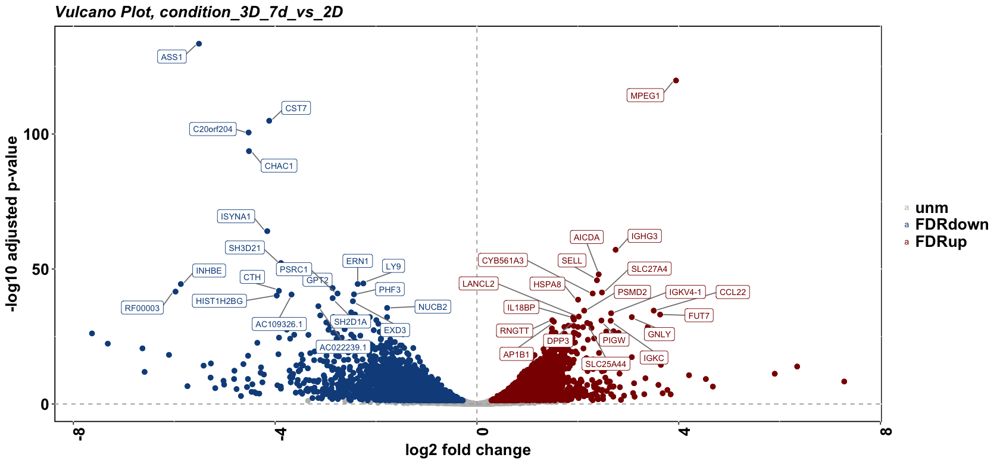

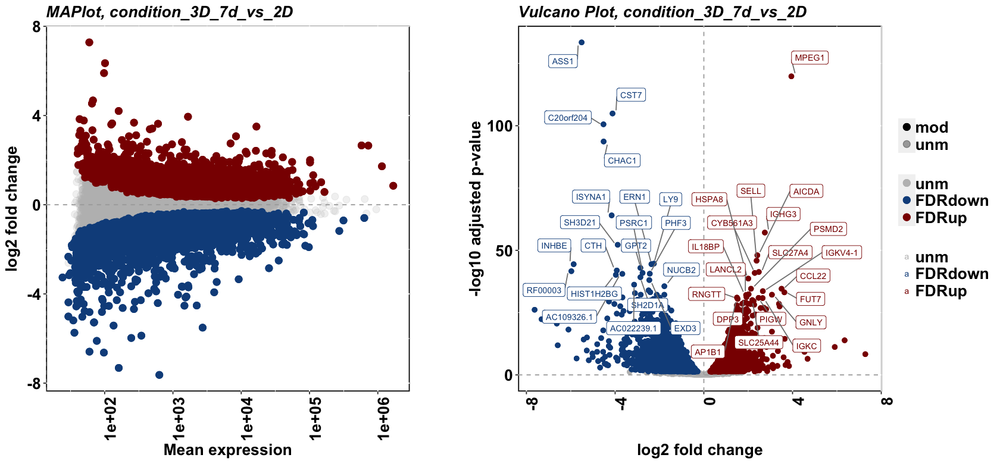

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Scale for 'x' is already present. Adding another scale for 'x', which will
replace the existing scale.



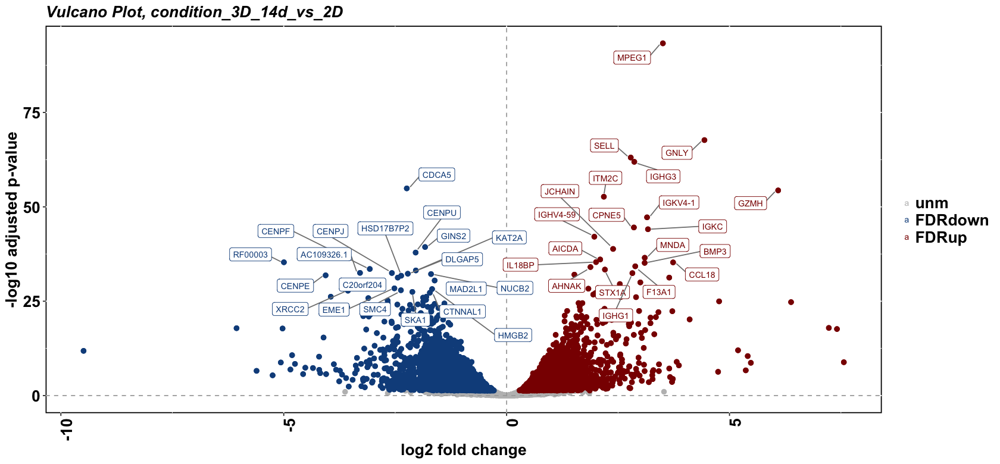

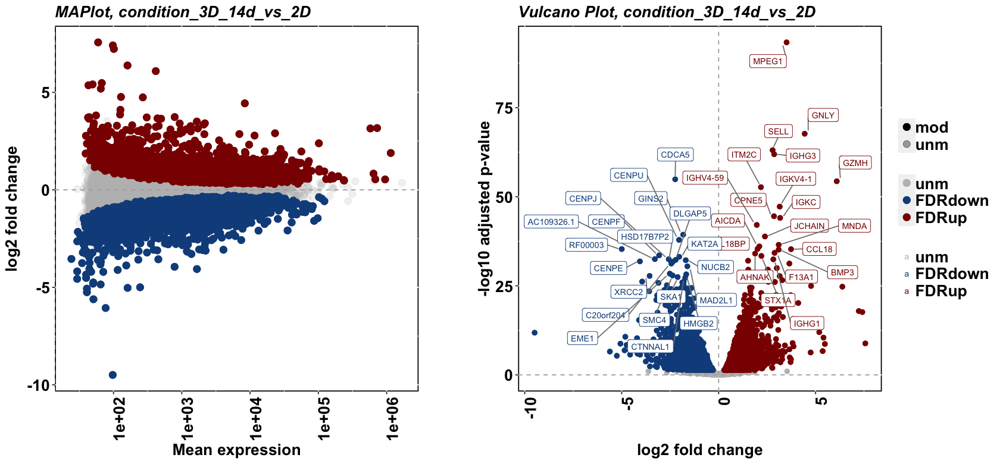

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


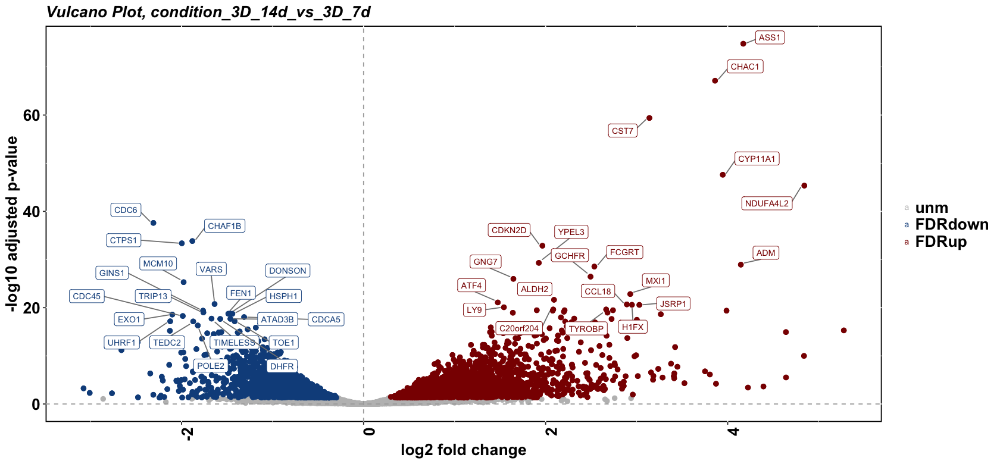

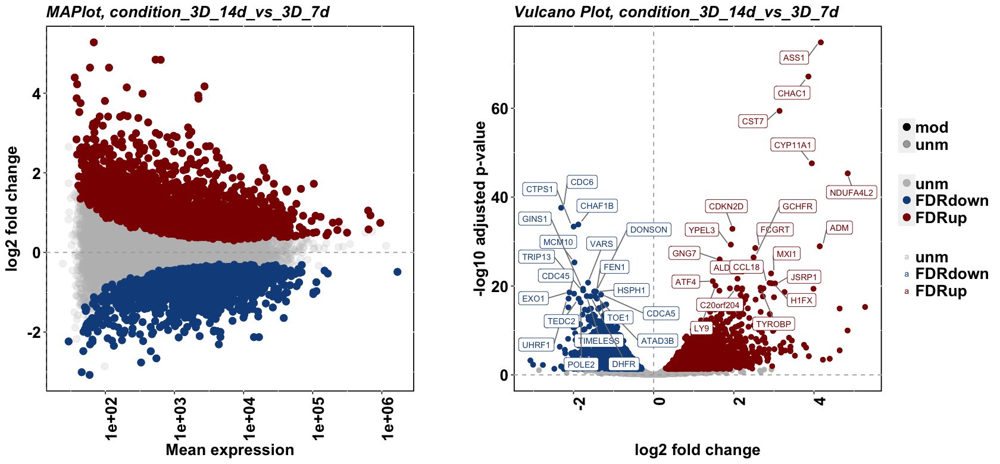

In [20]:
################ DGE - MAplot and Vulcano Plots ######################## 
f="dgeResults"
n.label = 20
FDR = T
pvalue = 0.01
for (condition in names(dgeResults)) {
    results = as.data.frame(dgeResults[[condition]])
    results$DE = 'unm'
    if (!FDR) {
        if (length(rownames(results[results$pvalue < pvalue & !is.na(results$padj) & results$log2FoldChange > 1,]))>0) {
            results[results$pvalue < pvalue & !is.na(results$padj) & results$log2FoldChange > 1,]$DE = 'up'}
        if (length(rownames(results[results$pvalue < pvalue & !is.na(results$padj) & results$log2FoldChange < -1,]))>0) {
            results[results$pvalue < pvalue & !is.na(results$padj) & results$log2FoldChange < .1,]$DE = 'down' }
    } else {
        if (length(rownames(results[results$padj < alpha & !is.na(results$padj) & results$log2FoldChange > 0,]))>0) {
            results[results$padj < alpha & !is.na(results$padj) & results$log2FoldChange > 0,]$DE = 'up'}
        if (length(rownames(results[results$padj < alpha & !is.na(results$padj) & results$log2FoldChange < 0,]))>0) {
            results[results$padj < alpha & !is.na(results$padj) & results$log2FoldChange < 0,]$DE = 'down' }        
    }
    if (length(rownames(results[results$pvalue < pvalue & !is.na(results$padj) & results$log2FoldChange > 1,]))>0) {
            results[results$pvalue < pvalue & !is.na(results$padj) & results$log2FoldChange > 1,]$DE = 'SEQCup'}
    if (length(rownames(results[results$pvalue < pvalue & !is.na(results$padj) & results$log2FoldChange < -1,]))>0) {
            results[results$pvalue < pvalue & !is.na(results$padj) & results$log2FoldChange < -1,]$DE = 'SEQCdown' }
    if (length(rownames(results[results$padj < alpha & !is.na(results$padj) & results$log2FoldChange > 0,]))>0) {
            results[results$padj < alpha & !is.na(results$padj) & results$log2FoldChange > 0,]$DE = 'FDRup'}
    if (length(rownames(results[results$padj < alpha & !is.na(results$padj) & results$log2FoldChange < 0,]))>0) {
            results[results$padj < alpha & !is.na(results$padj) & results$log2FoldChange < 0,]$DE = 'FDRdown' }        
    
    results$DE <- factor(x = results$DE, levels = c("unm", "FDRdown","FDRup", 'SEQCdown','SEQCup'))
    mycolors = c('grey','dodgerblue4','darkred','dodgerblue2','coral'); names(mycolors) = levels(results$DE)
    results$DE2 = 'unm'; results[results$DE!='unm',]$DE2 = 'mod'
    results$DE2 <- factor(x = results$DE2, levels = c("mod","unm"))
    mysize = c(3,2); names(mysize) = levels(results$DE2)
    myalpha = c(1,0.2); names(mysize) = unique(results$DE2)
    
    # label N genes
    N = min(n.label, length(rownames(results[results$DE == 'FDRup',])))
    up_label = rownames(results[results$DE == 'FDRup',])[1:N]
    N = min(n.label, length(rownames(results[results$DE == 'FDRdown',])))
    down_label = rownames(results[results$DE == 'FDRdown',])[1:N]
    
    MAplot = ggplot(results) +
    geom_point(aes(x=baseMean, y=log2FoldChange, color = DE, alpha = DE2), size = 3) +
    geom_point(data = subset(results, DE2 == 'mod'),
             aes(x=baseMean, y=log2FoldChange, color = DE, alpha = DE2), size = 3) +
    xlim(c(0,1.e5)) +
    scale_x_continuous(trans='log10') +
    ggtitle(paste("MAPlot,", condition)) +
    scale_color_manual(values = mycolors) +
    #scale_size_manual(values = mysize) +
    scale_alpha_manual(values = myalpha) +
    geom_hline(yintercept=0, linetype="dashed", color = "darkgrey") +
    geom_vline(xintercept=0, linetype="dashed", color = "darkgrey") +  
    theme(plot.title = element_text(color="black", size=16, face="bold.italic"),
      axis.text.x = element_text(angle = 90, face = "bold", color = "black", size=16, hjust =1), 
      axis.title.x = element_text(face = "bold", color = "black", size = 16),
      axis.text.y = element_text(angle = 0, face = "bold", color = "black", size=16),
      axis.title.y = element_text(face = "bold", color = "black", size = 16),
      legend.text = element_text(face = "bold", color = "black", size = 16),
      legend.title = element_text(face = "bold", color = "black", size = 0),
      legend.position="right",
      panel.background = element_rect(fill = "white",colour = "black", size = 1, linetype = "solid")) +
    labs(x = "Mean expression", y = "log2 fold change")  
    
    #print(MAplot)
    #pdf(paste(f,'/','MAplot_',condition,'.pdf',sep=''),width=8, height=6.5)
    #plot(MAplot)
    #dev.off()
    
        # Vulcano plot 
    VP = ggplot(results) +
    geom_point(aes(x=log2FoldChange, y=-log10(padj), color = DE), size =2) +
    geom_point(data = subset(results, DE2 == 'mod'),
               aes(x=log2FoldChange, y=-log10(padj), color = DE), size =2) +
    ggtitle(paste("Vulcano Plot,", condition)) +
    scale_color_manual(values = mycolors) +
    scale_size_manual(values = mysize) +
    scale_alpha_manual(values = myalpha) +
    geom_hline(yintercept=0, linetype="dashed", color = "darkgrey") +
    geom_vline(xintercept=0, linetype="dashed", color = "darkgrey") +
    geom_label_repel(data= results[c(up_label, down_label),], aes(x = log2FoldChange, y = -log10(padj), color = DE), 
                 label = row.names(results[c(up_label, down_label),]), size = 3,
                 box.padding = unit(0.35, "lines"), point.padding = unit(0.5, "lines"),segment.color = 'grey50') +
    theme(plot.title = element_text(color="black", size=16, face="bold.italic"),
      axis.text.x = element_text(angle = 90, face = "bold", color = "black", size=16, hjust =1), 
      axis.title.x = element_text(face = "bold", color = "black", size = 16),
      axis.text.y = element_text(angle = 0, face = "bold", color = "black", size=16),
      axis.title.y = element_text(face = "bold", color = "black", size = 16),
      legend.text = element_text(face = "bold", color = "black", size = 16),
      legend.title = element_text(face = "bold", color = "black", size = 0),
      legend.position="right",
      panel.background = element_rect(fill = "white",colour = "black", size = 1, linetype = "solid")) +
    labs(x = "log2 fold change", y = "-log10 adjusted p-value")   
    
    print(VP)
    pdf(paste(f,'/','VulcanoPlot_',condition,'.pdf',sep=''),width=8, height=6.5)
    plot(VP)
    dev.off()
    
    options(repr.plot.width=14, repr.plot.height=6.5)
    p1 = MAplot ; p2 = VP;   
    print((p1 + theme(plot.margin = unit(c(0,30,0,0), "pt"))) +
          (p2 + theme(plot.margin = unit(c(0,0,0,30), "pt"))) +  
          plot_layout(guides = "collect"))
    
    pdf(paste(f,'/','MA_VP_',condition,'.pdf',sep=''),width=16, height=6.5)
    print((p1 + theme(plot.margin = unit(c(0,30,0,0), "pt"))) +
          (p2 + theme(plot.margin = unit(c(0,0,0,30), "pt"))) +  
          plot_layout(guides = "collect"))
    dev.off()
    
    A1 <- image_read_pdf(paste(f,'/','MA_VP_',condition,'.pdf',sep=''), density = 70)
    image_write(A1, path = paste(f,'/','MA_VP_',condition,'.tiff',sep=''), format = "tiff")

}

In [21]:
####### FDR ########
# save FDR genes in a list
fdrUP = list()

alpha = 0.05
fdrUP = lapply(names(dgeResults), 
               function(x) row.names(dgeResults[[x]])[dgeResults[[x]]$padj <= alpha & 
                                        !is.na(dgeResults[[x]]$padj)&
                                        dgeResults[[x]]$log2FoldChange > 0])
names(fdrUP)= names(dgeResults)       
               
fdrDW = list()
fdrDW = lapply(names(dgeResults), 
               function(x) row.names(dgeResults[[x]])[dgeResults[[x]]$padj <= alpha & 
                                        !is.na(dgeResults[[x]]$padj)&
                                        dgeResults[[x]]$log2FoldChange < 0])
names(fdrDW)= names(dgeResults)

####### SEQC ########
# save SEQC genes in a list
seqcUP = list()

pvalue = 0.01
seqcUP = lapply(names(dgeResults), 
               function(x) row.names(dgeResults[[x]])[dgeResults[[x]]$pvalue <= pvalue & 
                                        !is.na(dgeResults[[x]]$padj)&
                                        dgeResults[[x]]$log2FoldChange > 1])
names(seqcUP)= names(dgeResults)               
               
seqcDW = list()
seqcDW = lapply(names(dgeResults), 
               function(x) row.names(dgeResults[[x]])[dgeResults[[x]]$pvalue <= pvalue & 
                                        !is.na(dgeResults[[x]]$padj)&
                                        dgeResults[[x]]$log2FoldChange < -1])
names(seqcDW)= names(dgeResults)
                
print('FDRup');lengths(fdrUP); print('FDRdw');lengths(fdrDW)
print('SEQCup');lengths(seqcUP); print('SEQCdw');lengths(seqcDW)

print('FDR_tot');lengths(fdrUP) + lengths(fdrDW)
print('SEQC_tot'); lengths(seqcUP) + lengths(seqcDW)

[1] "FDRup"


condition_3D_7d_vs_2D    condition_3D_14d_vs_2D condition_3D_14d_vs_3D_7d 
                     3168                      2893                      2373

[1] "FDRdw"


condition_3D_7d_vs_2D    condition_3D_14d_vs_2D condition_3D_14d_vs_3D_7d 
                     3198                      2585                      2133

[1] "SEQCup"


condition_3D_7d_vs_2D    condition_3D_14d_vs_2D condition_3D_14d_vs_3D_7d 
                     1073                       987                      1038

[1] "SEQCdw"


condition_3D_7d_vs_2D    condition_3D_14d_vs_2D condition_3D_14d_vs_3D_7d 
                     1613                      1174                       468

[1] "FDR_tot"


condition_3D_7d_vs_2D    condition_3D_14d_vs_2D condition_3D_14d_vs_3D_7d 
                     6366                      5478                      4506

[1] "SEQC_tot"


condition_3D_7d_vs_2D    condition_3D_14d_vs_2D condition_3D_14d_vs_3D_7d 
                     2686                      2161                      1506

In [22]:
############ Heatmaps with FDR genes - vertical orientation ############
for (i in names(fdrUP)) {
    re = c(fdrUP[[i]],fdrDW[[i]])
    a = unlist(str_split(i,'_'))
    c1=paste(a[2],a[3],sep = '_')
    if (length(a)==5) {c2=paste(a[5],sep = '_')} else {c2=paste(a[5],a[6],sep = '_')}
    samples= as.character(metadata[metadata$condition %in% c(c1,c2),]$SampleID)
    HP <- pheatmap::pheatmap(fCountsRPKM[re,samples],
                         scale = 'row',
                         annotation_col = annotation_column,
                         annotation_colors = ann_colors, 
                         cluster_rows = T, 
                         cluster_cols = T, 
                         cutree_cols  = 2,
                         #cutree_rows  = 2,
                         main = paste('FDR', i),
                         show_rownames = F,
                         fontsize = 12, fontsize_row = 10, fontsize_col = 14, 
                         display_numbers = F, 
                         col=colors,
                        filename = paste(f,'/Heatmap_v_',i,'.pdf',sep=''),
                        width = 7, height = 8.5)
    print(HP)
}

In [23]:
############ Heatmaps with FDR genes - horizontal orientation ############
for (i in names(fdrUP)) {
    re = c(fdrUP[[i]],fdrDW[[i]])
    a = unlist(str_split(i,'_'))
    c1=paste(a[2],a[3],sep = '_')
    if (length(a)==5) {c2=paste(a[5],sep = '_')} else {c2=paste(a[5],a[6],sep = '_')}
    samples= as.character(metadata[metadata$condition %in% c(c1,c2),]$SampleID)
    HP <- pheatmap::pheatmap(t(fCountsRPKM[re,samples]),
                         scale = 'column',
                         annotation_row = annotation_column,
                         annotation_colors = ann_colors, 
                         cluster_rows = T, 
                         cluster_cols = T, 
                         cutree_rows = 2,
                         #cutree_cols = 2,
                         main = paste('FDR', i),
                         show_rownames = T,
                         show_colnames = F,
                         fontsize = 12, fontsize_row = 9, fontsize_col = 14, 
                         display_numbers = F, 
                         col=colors,
                         filename =  paste(f,'/Heatmap_h_',i,'.pdf',sep=''),
                         width=18, height=8)
    print(HP)
    }

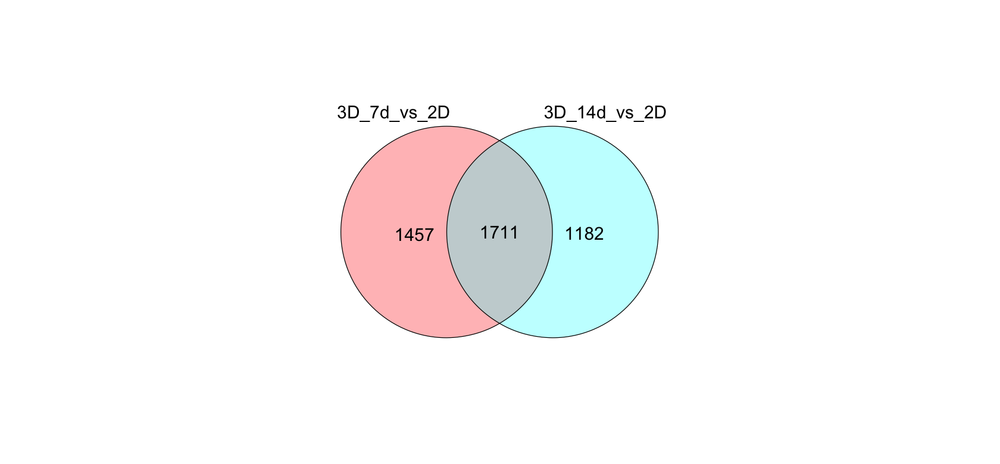

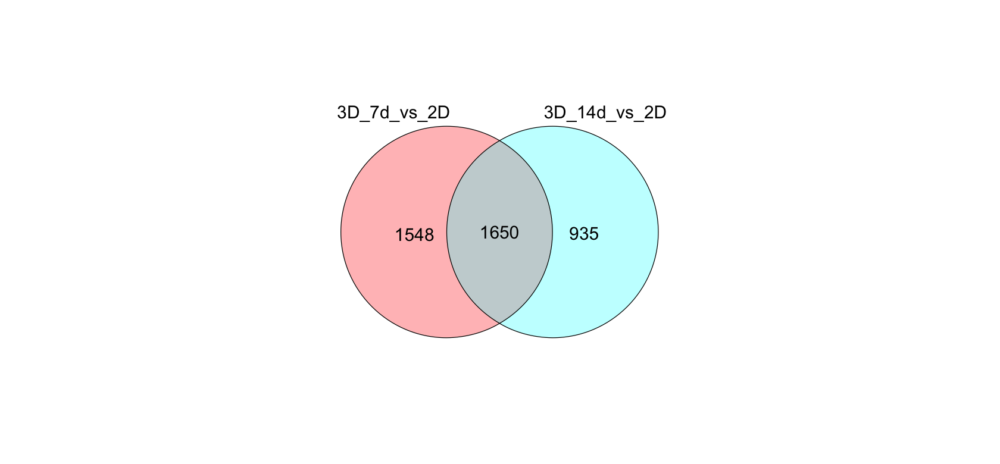

In [24]:
################ FDR gene intersection 3d vs 2d - venn::venn ################
list_Venn = fdrUP[1:2]
names(list_Venn) = str_sub(names(list_Venn),11,-1)
a = venn(list_Venn,
     simplify=F, opacity = 0.3, box = FALSE, ilab=TRUE, plotsize = 200, 
     zcolor = rainbow(2), intersection = T, ilcs = 1.5, sncs = 1.5)
list_intersection = attr(x = a, "intersections")
names(list_intersection) <- str_replace_all(names(list_intersection), ':', '_AND_')
list_dataframe = list()

for (element in names(list_intersection)) {
    if (nchar(element) > 12) {
        entry = data.frame(Intersection = element, gene = list_intersection[[element]])
        list_dataframe[[element]] = entry
        }
}

write.xlsx(list_dataframe,
           file = 'VENNintersection_up.xlsx',  
           row.names = F,
           asTable = T,
           sheetName = names(list_dataframe)) 

list_Venn = fdrDW[1:2]
names(list_Venn) = str_sub(names(list_Venn),11,-1)
a = venn(list_Venn,
     simplify=F, opacity = 0.3, box = FALSE, ilab=TRUE, plotsize = 200, 
     zcolor = rainbow(2), intersection = T, ilcs = 1.5, sncs = 1.5)
list_intersection = attr(x = a, "intersections")
names(list_intersection) <- str_replace_all(names(list_intersection), ':', '_AND_')
list_dataframe = list()
for (element in names(list_intersection)) {
    if (nchar(element) > 12) {
        entry = data.frame(Intersection = element, gene = list_intersection[[element]])
        list_dataframe[[element]] = entry
        }
}

write.xlsx(list_dataframe,
           file = 'VENNintersection_dw.xlsx',  
           row.names = F,
           asTable = T,
           sheetName = names(list_dataframe)) 

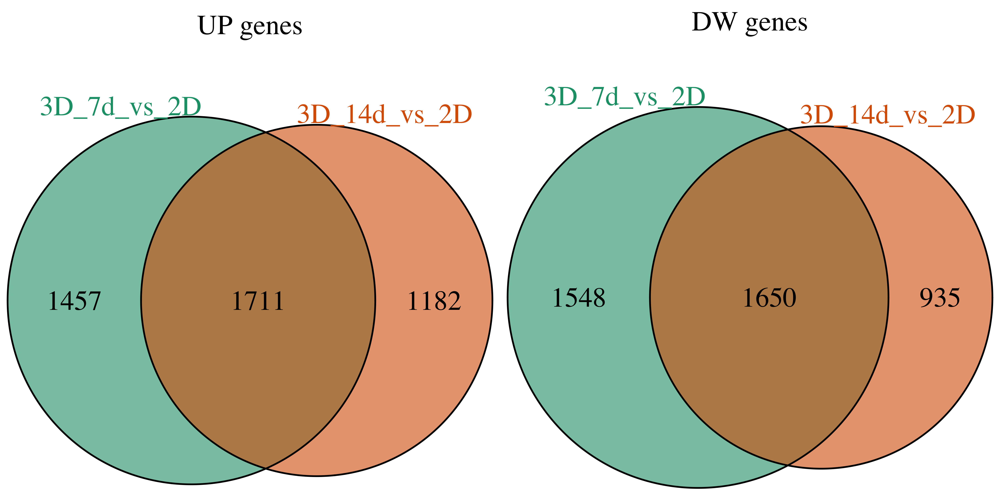

# A tibble: 1 x 7
  format width height colorspace matte filesize density
  <chr>  <int>  <int> <chr>      <lgl>    <int> <chr>  
1 TIFF    6000   3000 sRGB       TRUE         0 72x72  

In [25]:
#################### FDR gene intersection 3d vs 2d - VennPlot ################
# intersections
colors = mycolors_c[1:2]

# Venn plots
list_Venn = fdrUP[1:2]
venn.plot <- venn.diagram(
    x = list_Venn,
    category.names = str_sub(names(fdrUP[1:2]),11,-1),
    main = 'UP genes',
    filename = "Venn_genes_UP_3Dvs2D.tiff",
    scaled = TRUE,
    ext.text = TRUE,
    fill = mycolors_c[1:2],
    alpha = 0.6,
    cex = 2,
    cat.cex = 2,
    cat.pos = c(-20,20),
    cat.col = mycolors_c[1:2],
    main.cex = 2,
    sub.cex = 1)

list_Venn = fdrDW[1:2]
venn.plot <- venn.diagram(
    x = list_Venn,
    category.names = str_sub(names(fdrDW[1:2]),11,-1),
    main = 'DW genes',
    filename = "Venn_genes_DW_3Dvs2D.tiff",
    scaled = TRUE,
    ext.text = TRUE,
    fill = mycolors_c[1:2],
    alpha = 0.6,
    cex = 2,
    cat.cex = 2,
    cat.pos = c(-20,20),
    cat.col = mycolors_c[1:2],
    main.cex = 2,
    sub.cex = 1)

#BottleRocket2
Gstar = image_read("Venn_genes_UP_3Dvs2D.tiff")
Pstar = image_read("Venn_genes_DW_3Dvs2D.tiff")
im_star = image_append(c(Gstar, Pstar))
im_star
image_write(im_star, path = "Venn_UP_and_DW_3Dvs2D.tiff", format = "tiff")


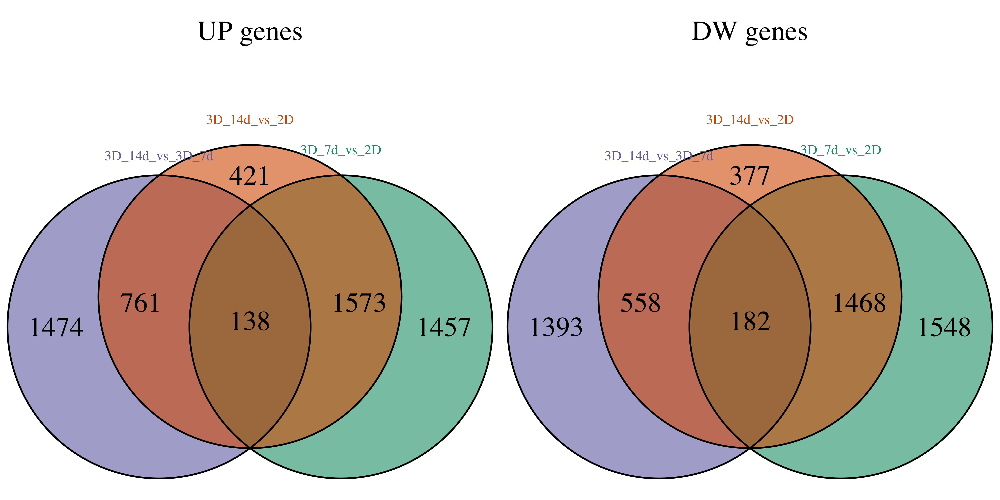

# A tibble: 1 x 7
  format width height colorspace matte filesize density
  <chr>  <int>  <int> <chr>      <lgl>    <int> <chr>  
1 TIFF    6000   3000 sRGB       TRUE         0 72x72  

In [26]:
#################### FDR gene intersection all - VennPlot ################
# intersections
colors = mycolors_c

# Venn plots
list_Venn = fdrUP
venn.plot <- venn.diagram(
    x = list_Venn,
    category.names = str_sub(names(fdrUP),11,-1),
    main = 'UP genes',
    filename = "Venn_genes_UP_all.tiff",
    scaled = TRUE,
    ext.text = TRUE,
    fill = colors,
    alpha = 0.6,
    cex = 2,
    cat.cex = 1,
    cat.pos = c(0,0,0),
    cat.col = colors,
    main.cex = 2,
    sub.cex = 1)

list_Venn = fdrDW
venn.plot <- venn.diagram(
    x = list_Venn,
    category.names = str_sub(names(fdrDW),11,-1),
    main = 'DW genes',
    filename = "Venn_genes_DW_all.tiff",
    scaled = TRUE,
    ext.text = TRUE,
    fill = colors,
    alpha = 0.6,
    cex = 2,
    cat.cex = 1,
    cat.pos = c(0,0,0),
    cat.col = colors,
    main.cex = 2,
    sub.cex = 1)

#BottleRocket2
Gstar = image_read("Venn_genes_UP_all.tiff")
Pstar = image_read("Venn_genes_DW_all.tiff")
im_star = image_append(c(Gstar, Pstar))
im_star
image_write(im_star, path = "Venn_UP_and_DW_all.tiff", format = "tiff")



In [27]:
###### enrichment #######

# -----------------------------
# Prepare lists of genes to run GSEA
# -----------------------------
outdir = 'GSEA/'
dir.create(outdir)
for (c in names(dgeResults)) {
    l_ranked = data.frame(GeneID= row.names(dgeResults[[c]]), LogFC = dgeResults[[c]][,'log2FoldChange'])
    l_ranked = l_ranked[order(l_ranked$LogFC, decreasing = T),]
    write.table(l_ranked, file = paste(outdir, c,'_ranked_list.rnk', sep =''), 
                quote = F, row.names= F, col.names = F, sep ='\t')
}

###### ENRICHR ########
databases <- listEnrichrDbs()

dir.create('enrichR/', showWarnings=FALSE, recursive=TRUE)
# -------------------------
# enrichment Parameters
# -------------------------
# databases to make the enrichment of
enrich.databases <- c("GO_Biological_Process_2018",
                      "GO_Cellular_Component_2018",
                      "GO_Molecular_Function_2018",
                      "Reactome_2016",
                      "KEGG_2016",
                      "WikiPathways_2016",
                      "BioCarta_2016")
# alpha used in DGE
padj.cutoff = alpha; 

# -------------------------
# Perform Enrichment
# -------------------------
enrichr.list <- list()
for (i in 1:length(dgeResults)){
    print(names(dgeResults)[i])
  .res <- dgeResults[[i]]
  up.genes   <- fdrUP[[i]]
  down.genes <- fdrDW[[i]]
  both.genes <- c(up.genes, down.genes)
    write.table(up.genes, paste('./enrichR/FDRup_',names(dgeResults)[i],
                              '.txt', sep =''), quote = F, 
                row.names = F, col.names = F)
    write.table(down.genes, paste('./enrichR/FDRdw_',names(dgeResults)[i],
                                '.txt', sep =''), 
                quote = F, row.names = F, col.names = F)
    write.table(both.genes, paste('./enrichR/FDRboth_',names(dgeResults)[i],
                              '.txt', sep =''), quote = F, 
                row.names = F, col.names = F)
    
    
  enrichr.list[[i]] <- lapply(list(up.genes,down.genes,both.genes),function(x) {
    enrichR::enrichr(genes = x, databases = enrich.databases)
      })
  names(enrichr.list[[i]]) <-  c("fdr_up","fdr_down","fdr_both")
}
names(enrichr.list) <- names(dgeResults)

# -----------------------------
# Write excels files
# -----------------------------

for (i in 1:length(dgeResults)){
  for (j in c("fdr_up","fdr_down","fdr_both")){
    filename = paste(
      file.path('enrichR', 
                names(dgeResults)[[i]]),
        j,
        ".xlsx",
        sep="_")
    write.xlsx(x = enrichr.list[[i]][[j]], file = filename)
  }
}


### Jaccard distances ###

# -------------------------
# Jaccard distances
# -------------------------
dir = paste("./enrichR/JaccardPlots/", sep = '')
dir.create(dir)
#'WikiPathways_2016'
#database = c('KEGG_2016','Reactome_2016','GO_Biological_Process_2018')
p.value.thr = 0.01

breaksList = seq(0, 1, by = 0.001)

cutree_rows_values = c(5,12,3,10,5,1)

lf = list.files(paste("./enrichR/", sep=''), pattern=glob2rx("*.xlsx"))
for (file in lf) {    
    enrichR.file = paste("./enrichR/",file,sep='')
    s = openxlsx::getSheetNames(enrichR.file)
    Pathways.Table = data.frame()
    for (dat in s[1:length(s)]) {
        Table <- read.xlsx(xlsxFile = enrichR.file, 
                            sheet = dat, 
                            startRow = 1, 
                            colNames = TRUE,
                            rowNames = TRUE, 
                            detectDates = FALSE, 
                            skipEmptyRows = TRUE,
                            skipEmptyCols = TRUE,
                            na.strings = "NA", 
                            fillMergedCells = FALSE)
        
        Pathways.Table = rbind(Pathways.Table, Table)
    }

    gene.list = list()
    gene.all = character()
    pathways = unlist(row.names(Pathways.Table[Pathways.Table$Adjusted.P.value < p.value.thr,]))
    
    for (p in pathways) {
    gene.list[[p]] <- unlist(strsplit(Pathways.Table[p,]$Genes, ';')) 
    gene.all = c(gene.all, unlist(strsplit(Pathways.Table[p,]$Genes, ';')))
    }
    gene.all = unique(gene.all)
    
    if (length(gene.all) !=0) {
    # MAtrix
    M = matrix(0, nrow = length(pathways), ncol = length(gene.all))
    row.names(M) = pathways 
    colnames(M) = gene.all 

    for (pat in pathways) {
        for (gene in gene.all) {
            if (gene %in% gene.list[[pat]]) {
                M[pat,gene] <- 1 
            }            
        }    
    }
    
      if (length(pathways) >1) {
    # Jaccard dist
    Jacard.Matrix <- distance(M, method = "jaccard")
    if (length(pathways)==2) {
        Jacard.Matrix_new = as.matrix(rbind(c(0,Jacard.Matrix),c(Jacard.Matrix,0)))
        Jacard.Matrix = Jacard.Matrix_new
    }
    
    row.names(Jacard.Matrix) <- pathways
    colnames(Jacard.Matrix) <- pathways
        
    w=14; h=8; fs = 4; cutree_rows_N = 5
    if (file=='b.resting_IL7_vs_b.resting_seqc_up_.xlsx'){w=14; h=10; fs = 4; cutree_rows_N = 3}
    myb = seq(0,1,by = 0.01)
    myc = colorRampPalette(brewer.pal(n = 7, name ="RdYlBu"))(length(myb))
    pheatmap(Jacard.Matrix,
             border_color = 'darkgrey',
             color = myc, 
             breaks = myb,
             cluster_rows = TRUE,
             cluster_cols = TRUE, 
             cutree_rows = cutree_rows_N,
             show_colnames = FALSE,
             main = paste(file,'- Jaccard distance heatmap'),
             fontsize = 12,
             fontsize_row = fs,
            filename = paste(dir,file,'_JaccardDist.pdf', sep=''),
            width=w, height=h)
        }
}
}

Warning message in dir.create(outdir):
“'GSEA' already exists”


[1] "condition_3D_7d_vs_2D"
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2018... Done.
  Querying GO_Cellular_Component_2018... Done.
  Querying GO_Molecular_Function_2018... Done.
  Querying Reactome_2016... Done.
  Querying KEGG_2016... Done.
  Querying WikiPathways_2016... Done.
  Querying BioCarta_2016... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2018... Done.
  Querying GO_Cellular_Component_2018... Done.
  Querying GO_Molecular_Function_2018... Done.
  Querying Reactome_2016... Done.
  Querying KEGG_2016... Done.
  Querying WikiPathways_2016... Done.
  Querying BioCarta_2016... Done.
Parsing results... Done.
Uploading data to Enrichr... Done.
  Querying GO_Biological_Process_2018... Done.
  Querying GO_Cellular_Component_2018... Done.
  Querying GO_Molecular_Function_2018... Done.
  Querying Reactome_2016... Done.
  Querying KEGG_2016... Done.
  Querying WikiPathways_2016... Done.
  Querying BioCarta_

Warning message in dir.create(dir):
“'./enrichR/JaccardPlots' already exists”
Metric: 'jaccard'; comparing: 419 vectors.

Metric: 'jaccard'; comparing: 456 vectors.

Metric: 'jaccard'; comparing: 430 vectors.

Metric: 'jaccard'; comparing: 411 vectors.

Metric: 'jaccard'; comparing: 678 vectors.

Metric: 'jaccard'; comparing: 92 vectors.

Metric: 'jaccard'; comparing: 394 vectors.

Metric: 'jaccard'; comparing: 115 vectors.

Metric: 'jaccard'; comparing: 639 vectors.



In [28]:
dev.off()

pdf 
  3

Warning message in dir.create(plotdir, recursive = T):
“'./enrichR/TOP_25_pathways' already exists”


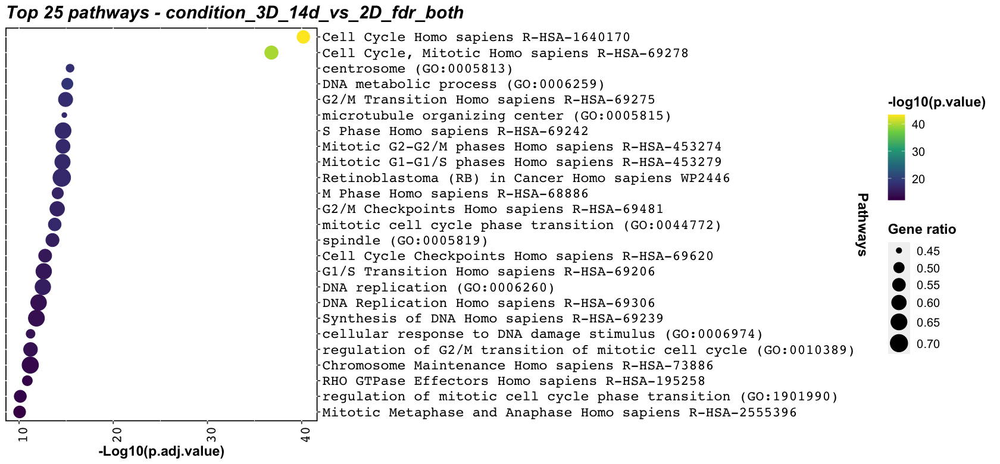

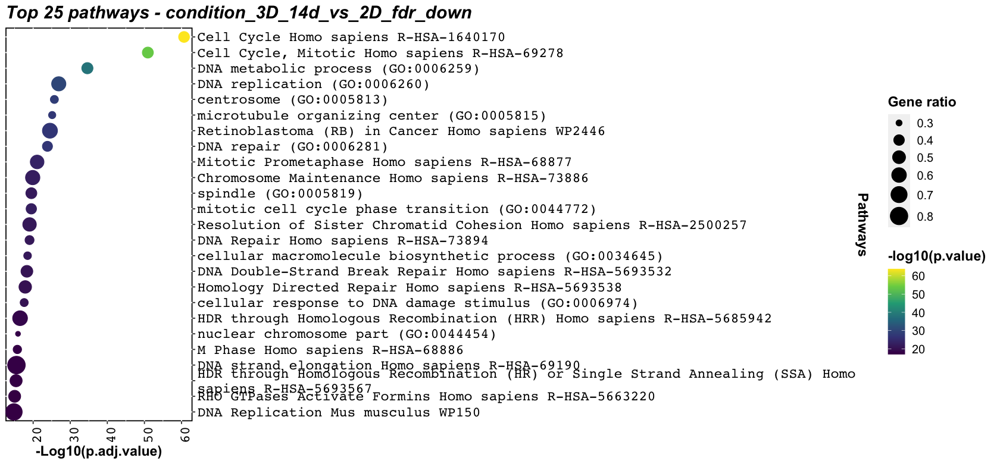

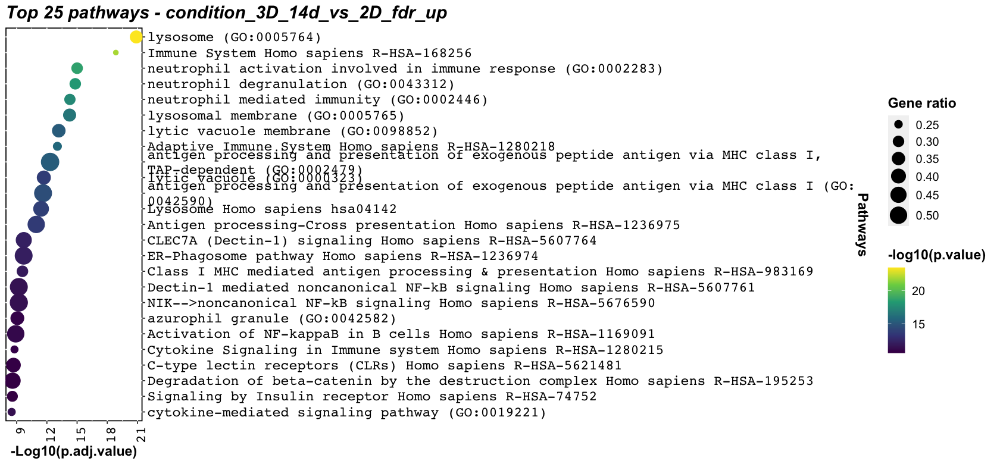

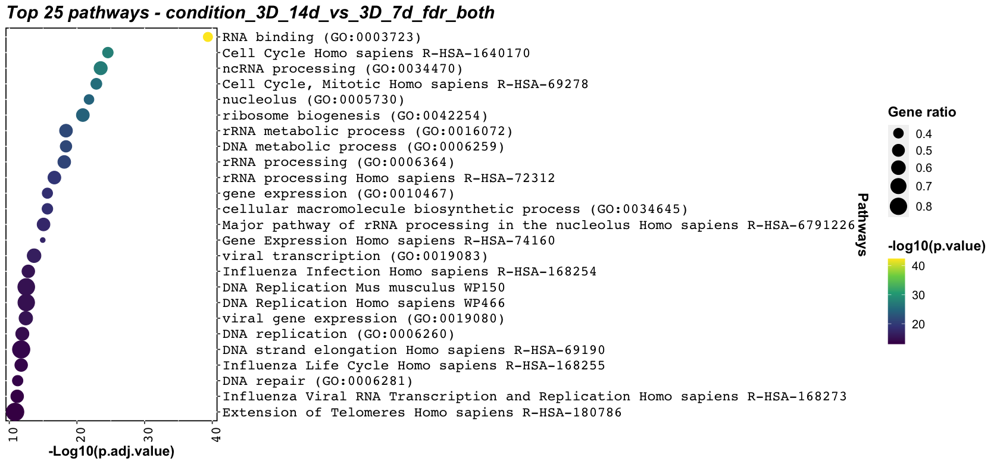

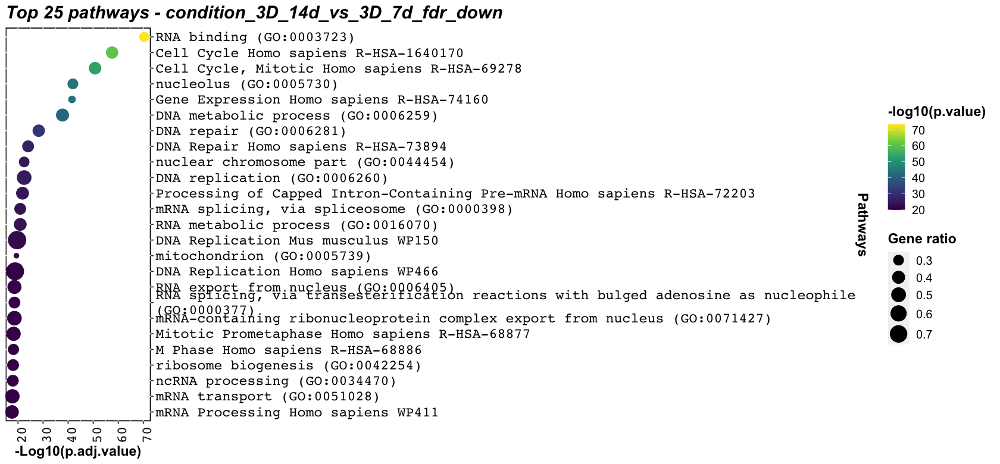

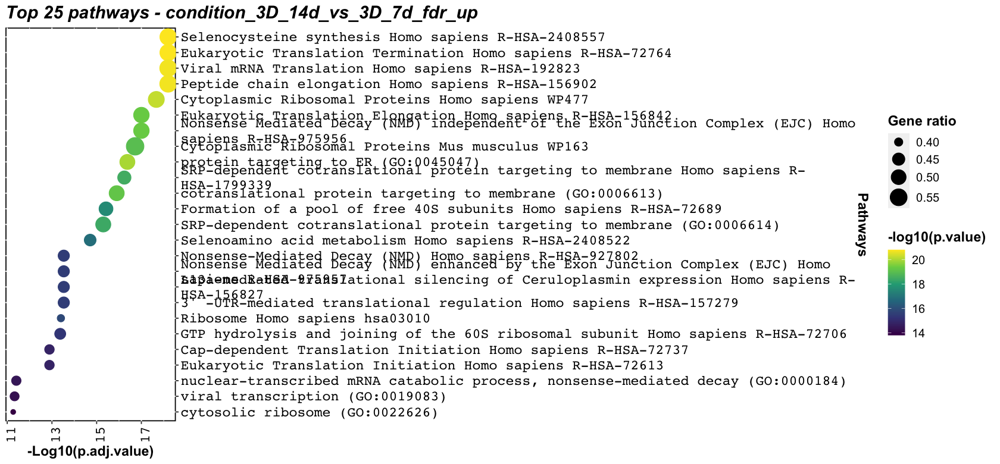

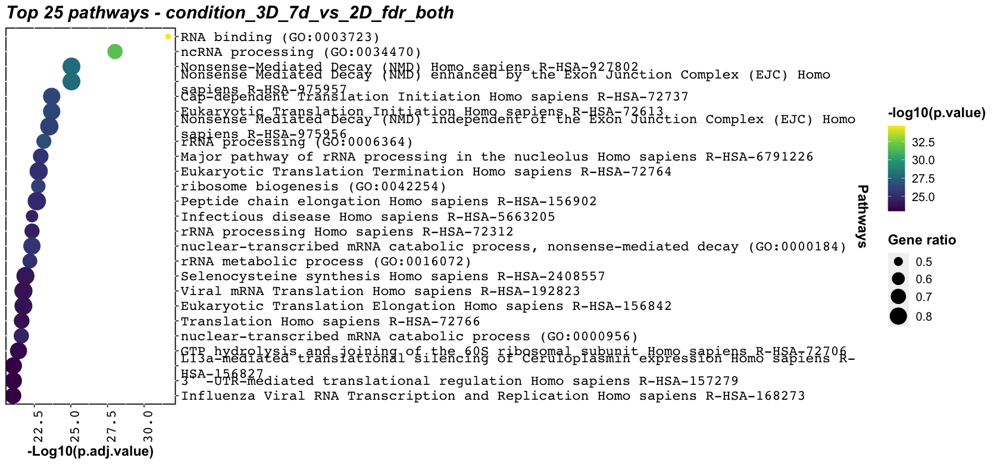

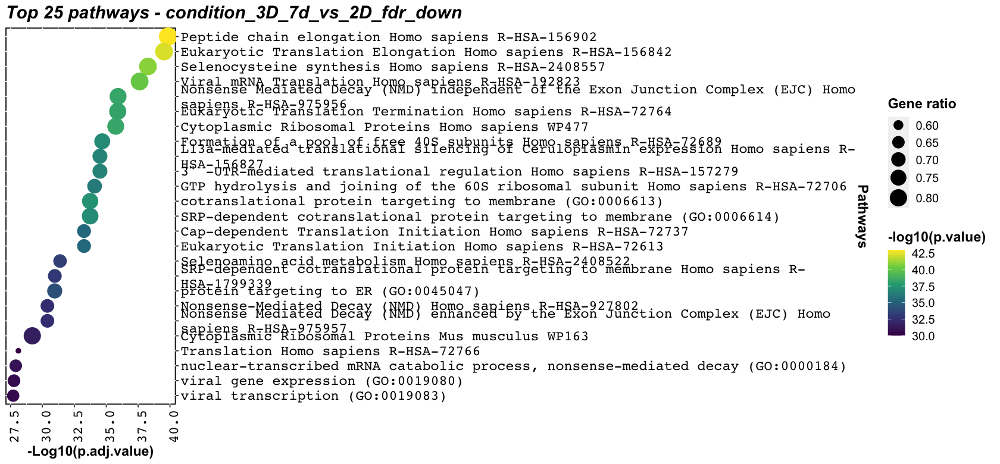

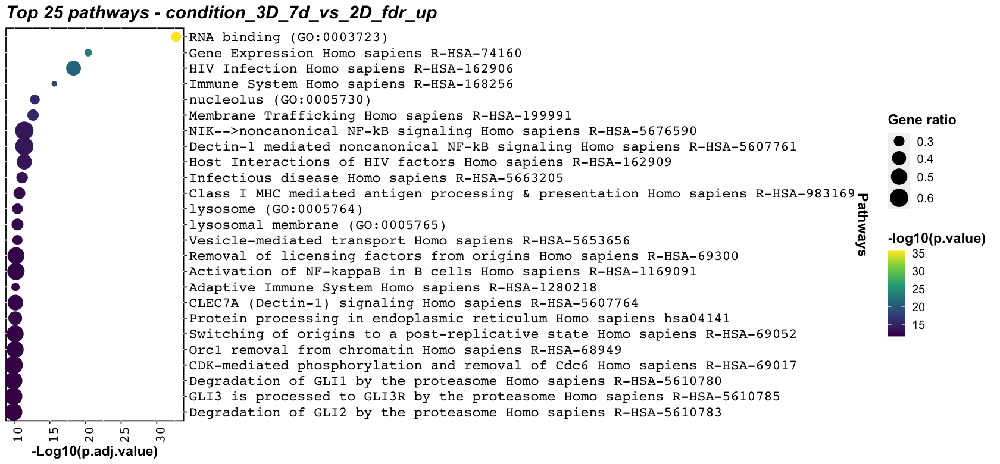

In [29]:
############## Plot top N pathways in a plot ################
fx <- function(x) eval(parse(text=enrichR.table[x,]$Overlap))
N=25
plotdir = paste('./enrichR/','TOP_',N,'_pathways/',sep='')
dir.create(plotdir, recursive = T)

path.sigs = list()

lf = list.files(paste("./enrichR/", sep=''), pattern=glob2rx("*.xlsx"))
for (file in lf) { 
    pathways.dataframe = data.frame()
    enrichR.file = paste("./enrichR/",file,sep='')
    s = openxlsx::getSheetNames(enrichR.file)
    enrichR.table = data.frame()
    for (dat in s[1:length(s)]) {
        Table <- read.xlsx(xlsxFile = enrichR.file, 
                            sheet = dat, 
                            startRow = 1, 
                            colNames = TRUE,
                            rowNames = TRUE, 
                            detectDates = FALSE, 
                            skipEmptyRows = TRUE,
                            skipEmptyCols = TRUE,
                            na.strings = "NA", 
                            fillMergedCells = FALSE)
        
        enrichR.table = rbind(enrichR.table, Table)
    }
    p = row.names(enrichR.table[enrichR.table$Adjusted.P.value < 0.005,])
    pathways.dataframe.entry = data.frame(Pathway = p,
                                          gene.ratio = sapply(p, fx),
                                          p.value = enrichR.table[p,]$P.value,
                                          p.value.adj = enrichR.table[p,]$Adjusted.P.value)
    pathways.dataframe <- rbind(pathways.dataframe, pathways.dataframe.entry) 
   
    path.sigs[[file]] = pathways.dataframe
    
    #up

    #pathways.dataframe = path.sigs[[file]]
    pathways.dataframe = pathways.dataframe[order(pathways.dataframe$p.value.adj),]
    pathways.dataframe$Pathway.num = dim(pathways.dataframe)[1]:1
    pathways.dataframe$Pathway.num = as.factor(pathways.dataframe$Pathway.num )
    
    
pd = ggplot(pathways.dataframe[1:N,], aes(Pathway.num,-log10(p.value.adj), 
                                          color = -log10(p.value))) + 
    geom_point(aes(size = gene.ratio)) +
    scale_size_continuous(range = c(2,8), name = "Gene ratio") +
    scale_color_continuous(type = "viridis") + #, limits =c(1,35)) + 
    #scale_colour_viridis_c(begin = 0, end = 40) + 
    #ylim(c(10,40)) +
    coord_flip() +
    scale_x_discrete(breaks=pathways.dataframe$Pathway.num, 
                     labels=stringr::str_wrap(pathways.dataframe$Pathway,width = 85),
                     position = "top") +
    theme(plot.title = element_text(color="black", size=18, face="bold.italic"),
          plot.subtitle = element_text(color="black", size=16, face="italic"),
          axis.text.x = element_text(angle = 90,, color = 'black', size=14, hjust =1, family = "mono"), 
          axis.title.x = element_text(face = "bold", color = "black", size = 14),
          axis.text.y = element_text(angle = 0, color = 'black', size=14, family = "mono"),
          axis.title.y = element_text(face = "bold", color = "black", size = 14),
          legend.text = element_text(color = "black", size = 12),
          legend.title = element_text(face = "bold", color = "black", size = 14),
          panel.background = element_rect(fill = "white",colour = "black", size = 1, linetype = "solid")) +
    labs(title = paste("Top", N, 'pathways -', str_sub(file,1,-7)), 
         x = "Pathways", 
         y = "-Log10(p.adj.value)") 
    print(pd)
    pdf(paste(plotdir, str_sub(file,1,-7),'_TOP',N,'.pdf',sep=''), 
        width = 14, height = 8)
    print(pd)
    dev.off()
    
}    



In [30]:
#up
N=20
pathways.dataframe = path.sigs[['condition_3D_14d_vs_2D_fdr_up_.xlsx']]
pathways.dataframe = pathways.dataframe[order(pathways.dataframe$p.value),]
pathways.dataframe$Pathway.num = dim(pathways.dataframe)[1]:1
pathways.dataframe$Pathway.num = as.factor(pathways.dataframe$Pathway.num )

pd = ggplot(pathways.dataframe[1:N,], aes(Pathway.num,-log10(p.value), color = -log10(p.value.adj))) + 
    geom_point(aes(size = gene.ratio)) +
    scale_size_continuous(range = c(2,10), name = "Gene ratio") +
    scale_color_continuous(type = "viridis", limits =c(1,35)) + 
    #scale_colour_viridis_c(begin = 0, end = 40) + 
    ylim(c(10,40)) +
    coord_flip() +
    scale_x_discrete(breaks=pathways.dataframe$Pathway.num, 
                     labels=stringr::str_wrap(pathways.dataframe$Pathway,width = 80),
                     position = "top") +
    theme(plot.title = element_text(color="black", size=18, face="bold.italic"),
          plot.subtitle = element_text(color="black", size=16, face="italic"),
          axis.text.x = element_text(angle = 90,, color = 'black', size=14, hjust =1, family = "mono"), 
          axis.title.x = element_text(face = "bold", color = "black", size = 14),
          axis.text.y = element_text(angle = 0, color = 'black', size=14, family = "mono"),
          axis.title.y = element_text(face = "bold", color = "black", size = 14),
          legend.text = element_text(color = "black", size = 12),
          legend.title = element_text(face = "bold", color = "black", size = 14),
          panel.background = element_rect(fill = "white",colour = "black", size = 1, linetype = "solid")) +
    labs(title = 'Significant Upregulated Pathways', 
         x = "Pathways", 
         y = "-Log10(p.adj.value)") 
        




In [31]:
# -----------------------------
# Jaccard distance heatmap
# -----------------------------
p.value.thr = 0.005

breaksList = seq(0, 1, by = 0.001)

cutree_rows_values = c(5,12,3,10,5,1)

lf = list.files(paste("./enrichR/", sep=''), pattern=glob2rx("*.xlsx"))
for (file in lf) {    
    enrichR.file = paste("./enrichR/",file,sep='')
    s = openxlsx::getSheetNames(enrichR.file)
    Pathways.Table = data.frame()
    for (dat in s[1:length(s)]) {
        Table <- read.xlsx(xlsxFile = enrichR.file, 
                            sheet = dat, 
                            startRow = 1, 
                            colNames = TRUE,
                            rowNames = TRUE, 
                            detectDates = FALSE, 
                            skipEmptyRows = TRUE,
                            skipEmptyCols = TRUE,
                            na.strings = "NA", 
                            fillMergedCells = FALSE)
        
        Pathways.Table = rbind(Pathways.Table, Table)
    }

    gene.list = list()
    gene.all = character()
    pathways = unlist(row.names(Pathways.Table[Pathways.Table$Adjusted.P.value < p.value.thr,]))
    
    for (p in pathways) {
    gene.list[[p]] <- unlist(strsplit(Pathways.Table[p,]$Genes, ';')) 
    gene.all = c(gene.all, unlist(strsplit(Pathways.Table[p,]$Genes, ';')))
    }
    gene.all = unique(gene.all)
    
    if (length(gene.all) !=0) {
    # MAtrix
    M = matrix(0, nrow = length(pathways), ncol = length(gene.all))
    row.names(M) = pathways 
    colnames(M) = gene.all 

    for (pat in pathways) {
        for (gene in gene.all) {
            if (gene %in% gene.list[[pat]]) {
                M[pat,gene] <- 1 
            }            
        }    
    }
    
      if (length(pathways) >1) {
    # Jaccard dist
    Jacard.Matrix <- distance(M, method = "jaccard")
    if (length(pathways)==2) {
        Jacard.Matrix_new = as.matrix(rbind(c(0,Jacard.Matrix),c(Jacard.Matrix,0)))
        Jacard.Matrix = Jacard.Matrix_new
    }
    
    row.names(Jacard.Matrix) <- pathways
    colnames(Jacard.Matrix) <- pathways
        
    w=14; h=10; fs = 3; cutree_rows_N = 5
    if (file=='condition_3D_7d_vs_2D_fdr_down_.xlsx'){w=14; h=10; fs = 6; cutree_rows_N = 8}
    if (file=='condition_3D_7d_vs_2D_fdr_up_.xlsx'){w=14; h=15; fs = 2; cutree_rows_N = 8} 
    if (file=='condition_3D_14d_vs_2D_fdr_down_.xlsx'){w=14; h=15; fs = 2; cutree_rows_N = 8}
    if (file=='condition_3D_14d_vs_2D_fdr_up_.xlsx'){w=14; h=15; fs = 2; cutree_rows_N = 8}
    if (file=='condition_3D_14d_vs_3D_7d_fdr_down_.xlsx'){w=14; h=15; fs = 2; cutree_rows_N = 8}
    if (file=='condition_3D_14d_vs_3D_7d_fdr_up_.xlsx'){w=14; h=10; fs = 5; cutree_rows_N = 6}
    myb = seq(0,1,by = 0.01)
    myc = colorRampPalette(brewer.pal(n = 7, name ="RdYlBu"))(length(myb))
    pheatmap(Jacard.Matrix,
             border_color = 'darkgrey',
             color = myc, 
             breaks = myb,
             cluster_rows = TRUE,
             cluster_cols = TRUE, 
             cutree_rows = cutree_rows_N,
             show_colnames = FALSE,
             main = paste(file,'- Jaccard distance heatmap'),
             fontsize = 12,
             fontsize_row = fs,
            filename = paste(dir,file,'_JaccardDist.pdf', sep=''),
            width=w, height=h)
        }
}
}

Metric: 'jaccard'; comparing: 355 vectors.

Metric: 'jaccard'; comparing: 403 vectors.

Metric: 'jaccard'; comparing: 375 vectors.

Metric: 'jaccard'; comparing: 356 vectors.

Metric: 'jaccard'; comparing: 622 vectors.

Metric: 'jaccard'; comparing: 88 vectors.

Metric: 'jaccard'; comparing: 350 vectors.

Metric: 'jaccard'; comparing: 106 vectors.

Metric: 'jaccard'; comparing: 540 vectors.



In [32]:
dat

[1] "BioCarta_2016"

In [33]:
################ Query enrichR table with input specified keywords ####################

pathways_list = list()
keywords = c('survival','death','cytoskeleton','cytokine','chemokine',
             'adhesion','immunoglobulin')
lf = list.files(paste("./enrichR/", sep=''), pattern=glob2rx("*.xlsx"))

kdir = "keywords_search/"
dir.create(kdir)

kedir = "grepping_EnrichRresults/"
dir.create(paste(kdir,kedir,sep=''))

for (file in lf) {    
    enrichR.file = paste("./enrichR/",file,sep='')
    s = openxlsx::getSheetNames(enrichR.file)
    Pathways.Table = data.frame()
    for (dat in s[1:length(s)]) {
        Table <- read.xlsx(xlsxFile = enrichR.file, 
                            sheet = dat, 
                            startRow = 1, 
                            colNames = TRUE,
                            rowNames = TRUE, 
                            detectDates = FALSE, 
                            skipEmptyRows = TRUE,
                            skipEmptyCols = TRUE,
                            na.strings = "NA", 
                            fillMergedCells = FALSE)
        Table$database = dat
        Pathways.Table = rbind(Pathways.Table, Table)
    }
    for (k in keywords) {
    pathways_list[[file]][[k]] = Pathways.Table[grep(k, rownames(Pathways.Table), ignore.case = TRUE),]
    }
    write.xlsx(x = pathways_list[[file]], file = paste(kdir,kedir,'keywords_',file,sep =''), row.names = TRUE, asTable = TRUE)
    }


Warning message in dir.create(kdir):
“'keywords_search' already exists”
Warning message in dir.create(paste(kdir, kedir, sep = "")):
“'keywords_search/grepping_EnrichRresults' already exists”


# pathways cluster

In [34]:
#BiocManager::install("clusterProfiler")
#BiocManager::install("pathview")
#BiocManager::install("org.Hs.eg.db")

In [38]:
library(biomaRt)
# conversion
gene_list = row.names(fCountsData)
ensembl97 = useMart("ensembl",
                    dataset="hsapiens_gene_ensembl", 
                    host = 'http://jul2019.archive.ensembl.org')
#listFilters(ensembl97)
dictionary_Tascini = getBM(attributes= c('ensembl_gene_id', 'external_gene_name', 'entrezgene_id'),
                           filter = 'external_gene_name',
                           values = gene_list,
                           mart = ensembl97)

Warning message:
“`select_()` is deprecated as of dplyr 0.7.0.
Please use `select()` instead.
This warning is displayed once every 8 hours.
Call `lifecycle::last_warnings()` to see where this warning was generated.”
Warning message:
“`filter_()` is deprecated as of dplyr 0.7.0.
Please use `filter()` instead.
See vignette('programming') for more help
This warning is displayed once every 8 hours.
Call `lifecycle::last_warnings()` to see where this warning was generated.”

Batch submitting query [>------------------------------]   2% eta:  4m

Batch submitting query [>------------------------------]   3% eta:  3m

Batch submitting query [=>-----------------------------]   5% eta:  3m

Batch submitting query [=>-----------------------------]   7% eta:  3m

Batch submitting query [==>----------------------------]   8% eta:  3m

Batch submitting query [==>----------------------------]  10% eta:  3m

Batch submitting query [===>---------------------------]  12% eta:  3m

Batch submitting quer

# Enrichment (fisher)

In [39]:
############## cluster_profiler: Reactome Fisher Test - emaplot and cnetplot ################
# pretty slow - need to improve code efficiency -> for cicle replacement with ext function

library(clusterProfiler)
library(enrichplot)
library(ReactomePA)


folder= 'cluster_profiler/'
dir.create(folder)

# extract genes
T=1 # threshould logFC
organism = "org.Hs.eg.db"
library(organism, character.only = TRUE)

for (i in names(dgeResults)) {
    #i = names(dgeResults)[1]
    df = dgeResults[[i]]

    # we want the log2 fold change 
    original_gene_list <- df$log2FoldChange
    # we want the log2 fold change 
    original_gene_list <- df$log2FoldChange
    # name the vector
    names(original_gene_list) <- row.names(df)
    # omit any NA values 
    gene_list<-na.omit(original_gene_list)
    # sort the list in decreasing order (required for clusterProfiler)
    gene_list = sort(gene_list, decreasing = TRUE)
    # Exctract significant results (padj < 0.05)
    sig_genes_df = subset(df, padj < 0.05)
    # From significant results, we want to filter on log2fold change
    genes <- sig_genes_df$log2FoldChange
    # Name the vector
    names(genes) <- row.names(sig_genes_df)
    # omit NA values
    genes <- na.omit(genes)
    # filter on min log2fold change (log2FoldChange > 2)
    genesl = list()
    genesl[["both"]] <- names(genes)[abs(genes) > T]
    genesl[["up"]] <- names(genes)[genes > T]
    genesl[["down"]] <- names(genes)[genes < -T]
    
    for (c in names(genesl)) {
        # prepare data
        genes_ensemble_t = dictionary_Tascini[dictionary_Tascini$external_gene_name %in% genesl[[c]],]
        dedup_genes_ensemble_t = genes_ensemble_t[!duplicated(genes_ensemble_t[c("external_gene_name")]),]
        genes_entrez = dedup_genes_ensemble_t$entrezgene_id
        # ReactomePathways #
        ReactomePA <- enrichPathway(gene=genes_entrez, pvalueCutoff = 0.05, readable=TRUE)
        write.xlsx(x= ReactomePA@result, file = paste(folder,'ReactomeTable_',c,'_',i,'.xlsx',sep=''), asTable = TRUE)
        
        node=7
        if (c == 'down') {node = 6}
        if (i =='condition_3D_14d_vs_3D_7d') {node=6}
        #plot
        plot_ReactomePA = cnetplot(ReactomePA, showCategory = node, 
                                   categorySize="pvalue", foldChange=gene_list, 
                                   circular = FALSE, colorEdge = TRUE) 
        emap_ReactomePA =emapplot(ReactomePA, showCategory = 25, color = "p.adjust", layout = "kk",
                                  pie_scale = 1,line_scale =0)
        #saveplot
        pdf(paste(folder,'cnetplot_ReactomePA_',c,'_',i,'.pdf',sep=''), width = 16, height = 8)
        print(plot_ReactomePA)
        dev.off()  
        pdf(paste(folder,'emapplot_ReactomePA_',c,'_',i,'.pdf',sep=''), width = 16, height = 8)
        print(emap_ReactomePA)
        dev.off()  
    }

}



Registered S3 method overwritten by 'enrichplot':
  method               from
  fortify.enrichResult DOSE

clusterProfiler v3.14.3  For help: https://guangchuangyu.github.io/software/clusterProfiler

If you use clusterProfiler in published research, please cite:
Guangchuang Yu, Li-Gen Wang, Yanyan Han, Qing-Yu He. clusterProfiler: an R package for comparing biological themes among gene clusters. OMICS: A Journal of Integrative Biology. 2012, 16(5):284-287.


Attaching package: ‘clusterProfiler’


The following object is masked from ‘package:DelayedArray’:

    simplify



Attaching package: ‘enrichplot’


The following object is masked from ‘package:ggpubr’:

    color_palette


ReactomePA v1.30.0  For help: https://guangchuangyu.github.io/ReactomePA

If you use ReactomePA in published research, please cite:
Guangchuang Yu, Qing-Yu He. ReactomePA: an R/Bioconductor package for reactome pathway analysis and visualization. Molecular BioSystems 2016, 12(2):477-479

Warning message in di

In [40]:
############## cluster_profiler: Fisher Test GOBP - emaplot and cnetplot ################
# pretty slow - need to improve code efficiency 

for (i in names(dgeResults)) {
    df = dgeResults[[i]]

    # we want the log2 fold change 
    original_gene_list <- df$log2FoldChange
    # we want the log2 fold change 
    original_gene_list <- df$log2FoldChange
    # name the vector
    names(original_gene_list) <- row.names(df)
    # omit any NA values 
    gene_list<-na.omit(original_gene_list)
    # sort the list in decreasing order (required for clusterProfiler)
    gene_list = sort(gene_list, decreasing = TRUE)
    # Exctract significant results (padj < 0.05)
    sig_genes_df = subset(df, padj < 0.05)
    # From significant results, we want to filter on log2fold change
    genes <- sig_genes_df$log2FoldChange
    # Name the vector
    names(genes) <- row.names(sig_genes_df)
    # omit NA values
    genes <- na.omit(genes)
    # filter on min log2fold change (log2FoldChange > 2)

    genesl = list()
    genesl[["both"]] <- names(genes)[abs(genes) > T]
    genesl[["up"]] <- names(genes)[genes > T]
    genesl[["down"]] <- names(genes)[genes < -T]


    ###### GO BP #######
    for (c in names(genesl)) {
        # enrichment
        go_enrich <- enrichGO(gene = genesl[[c]],
                      universe = names(gene_list),
                      OrgDb = organism, 
                      keyType = 'ALIAS',
                      readable = T,
                      ont = "BP",
                      pvalueCutoff = 0.05, 
                      qvalueCutoff = 0.10)
        #save results in excel
        write.xlsx(x= go_enrich@result, file = paste(folder,'GOBPtable_',c,'_',i,'.xlsx',sep=''), asTable = TRUE)
        node=5
        #plotting 
        plot_GOBP = cnetplot(go_enrich, showCategory = node, 
                             categorySize="pvalue", foldChange=gene_list, 
                             circular = FALSE, colorEdge = TRUE)
        emap_GOBP =emapplot(go_enrich, showCategory = 25, color = "p.adjust", 
                            layout = "kk", pie_scale = 1,line_scale =0)        
        pdf(paste(folder,'cnetplot_GOBP_',c,'_',i,'.pdf',sep=''), 
            width = 16, height = 8)
        print(plot_GOBP)
        dev.off()       
        pdf(paste(folder,'emapplot_GOBP_',c,'_',i,'.pdf',sep=''), 
            width = 16, height = 8)
        print(emap_GOBP)
        dev.off()
        
    }
    
}

In [41]:
################ Query GOBP and Reactome table with specified keywords ####################

pathways_list = list()
keywords = c('survival','death','cytoskeleton','cytokine','chemokine',
             'adhesion','immunoglobulin')
lf = list.files(paste("./cluster_profiler/", sep=''), pattern=glob2rx("*.xlsx"))

kdir = "keywords_search/"
dir.create(kdir)

kcdir = "grepping_clusterProfilerResults/"
dir.create(paste(kdir, kcdir, sep=''))

for (file in lf) {    
    enrichR.file = paste("./cluster_profiler/",file,sep='')
    s = openxlsx::getSheetNames(enrichR.file)
    Pathways.Table = data.frame()
    for (dat in s[1:length(s)]) {
        Table <- read.xlsx(xlsxFile = enrichR.file, 
                            sheet = dat, 
                            startRow = 1, 
                            colNames = TRUE,
                            rowNames = TRUE, 
                            detectDates = FALSE, 
                            skipEmptyRows = TRUE,
                            skipEmptyCols = TRUE,
                            na.strings = "NA", 
                            fillMergedCells = FALSE)
        
        Pathways.Table = rbind(Pathways.Table, Table)
    }
    for (k in keywords) {
    pathways_list[[file]][[k]] = Pathways.Table[grep(k, Pathways.Table$Description, ignore.case = TRUE),]
    }
    write.xlsx(x = pathways_list[[file]], file = paste(kdir,kcdir,'keywords_',file,sep =''), row.names = TRUE, asTable = TRUE)
    }


Warning message in dir.create(kdir):
“'keywords_search' already exists”
Warning message in dir.create(paste(kdir, kcdir, sep = "")):
“'keywords_search/grepping_clusterProfilerResults' already exists”


In [42]:
#install.packages("ggupset")
library(ggplot2)
library(tidyverse, warn.conflicts = FALSE)
library(ggupset)
#upsetplot(go_enrich_up)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

✔ tibble  3.0.4     ✔ purrr   0.3.4
✔ tidyr   1.1.2     ✔ forcats 0.5.0
✔ readr   1.3.1     

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ ggplot2::Position()     masks BiocGenerics::Position(), base::Position()
✖ dplyr::between()        masks data.table::between()
✖ dplyr::collapse()       masks IRanges::collapse()
✖ gridExtra::combine()    masks dplyr::combine(), Biobase::combine(), BiocGenerics::combine()
✖ dplyr::count()          masks matrixStats::count()
✖ dplyr::desc()           masks IRanges::desc()
✖ tidyr::expand()         masks S4Vectors::expand()
✖ dplyr::filter()         masks stats::filter()
✖ dplyr::first()          masks S4Vectors::first(), data.table::first()
✖ dplyr::lag()            masks stats::lag()
✖ dplyr::last()           masks data.table::last()
✖ purrr::reduce()         masks GenomicRanges::reduce(), IRanges::reduce()
✖ dplyr::rename()       

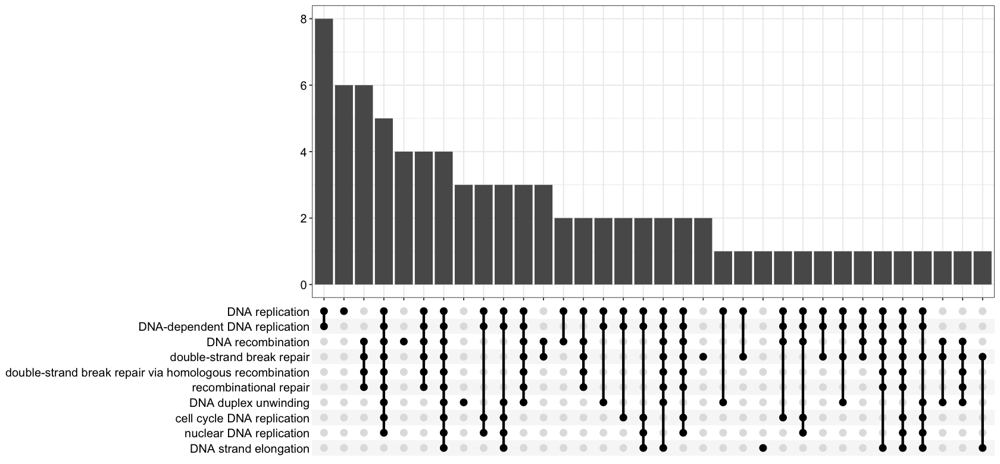

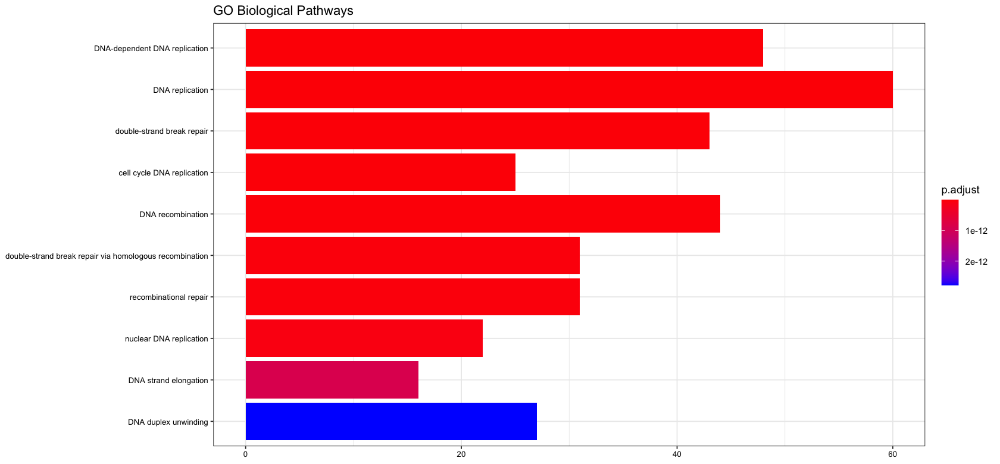

In [43]:
# other plots
upsetplot(go_enrich)
barplot(go_enrich, 
        drop = TRUE, 
        showCategory = 10, 
        title = "GO Biological Pathways",
        font.size = 8)

# GSEA

In [44]:
##################### GSEA #####################
# reading in data from deseq2
i = 1
df = dgeResults[[i]]

# we want the log2 fold change 
original_gene_list <- df$log2FoldChange

# name the vector
names(original_gene_list) <- row.names(df)

# omit any NA values 
gene_list<-na.omit(original_gene_list)

# sort the list in decreasing order (required for clusterProfiler)
gene_list = sort(gene_list, decreasing = TRUE)

In [73]:
?gseGO

In [45]:
# GSEA GO ALL ontologies
gse <- gseGO(geneList=gene_list, 
             ont ="ALL", 
             keyType = "ALIAS", 
             nPerm = 10000, 
             minGSSize = 3, 
             maxGSSize = 800, 
             pvalueCutoff = 0.05, 
             verbose = TRUE, 
             OrgDb = organism, 
             pAdjustMethod = "none")

preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...



In [46]:
######## prepare kegg dataframe ###########
# i could also use dictionary_Tascini -> it could be probably better
organism = "org.Hs.eg.db"
ids <-bitr(names(gene_list), fromType = "ALIAS", toType = "ENTREZID", OrgDb=organism)
dedup_ids = ids[!duplicated(ids[c("ALIAS")]),]
df = as.data.frame(df)
df$GeneID = row.names(df)
df2 = df[dedup_ids$ALIAS,]

# Create a new column in df2 with the corresponding ENTREZ IDs
df2$Y = dedup_ids$ENTREZID

# Create a vector of the gene unuiverse
kegg_gene_list <- df2$log2FoldChange

# Name vector with ENTREZ ids
names(kegg_gene_list) <- df2$Y

# omit any NA values 
kegg_gene_list<-na.omit(kegg_gene_list)

# sort the list in decreasing order (required for clusterProfiler)
kegg_gene_list = sort(kegg_gene_list, decreasing = TRUE)

#check
head(kegg_gene_list)
head(gene_list)

'select()' returned 1:many mapping between keys and columns

Warning message in bitr(names(gene_list), fromType = "ALIAS", toType = "ENTREZID", :
“9.28% of input gene IDs are fail to map...”


3039      3852    124912      9843 100423062    219972 
 6.348038  5.903470  4.676893  4.537734  4.204099  3.946393

AC078925.4       HBA1       KRT5     SPACA3       HEPH      IGLL5 
  7.281050   6.348038   5.903470   4.676893   4.537734   4.204099

In [47]:
# gsea KEGG
kk2 <- gseKEGG(geneList     = kegg_gene_list,
               organism     = "hsa",
               nPerm        = 10000,
               minGSSize    = 3,
               maxGSSize    = 800,
               pvalueCutoff = 0.05,
               pAdjustMethod = "none",
               keyType       = "ncbi-geneid")

preparing geneSet collections...

GSEA analysis...

Warning message in fgsea(pathways = geneSets, stats = geneList, nperm = nPerm, minSize = minGSSize, :
“There are duplicate gene names, fgsea may produce unexpected results”
leading edge analysis...

done...



In [48]:
# gsea only GOBP
gse_BP <- gseGO(geneList=gene_list, 
             ont ="BP", 
             keyType = "ALIAS", 
             nPerm = 10000, 
             minGSSize = 3, 
             maxGSSize = 800, 
             pvalueCutoff = 0.05, 
             verbose = TRUE, 
             OrgDb = organism, 
             pAdjustMethod = "none")

preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...



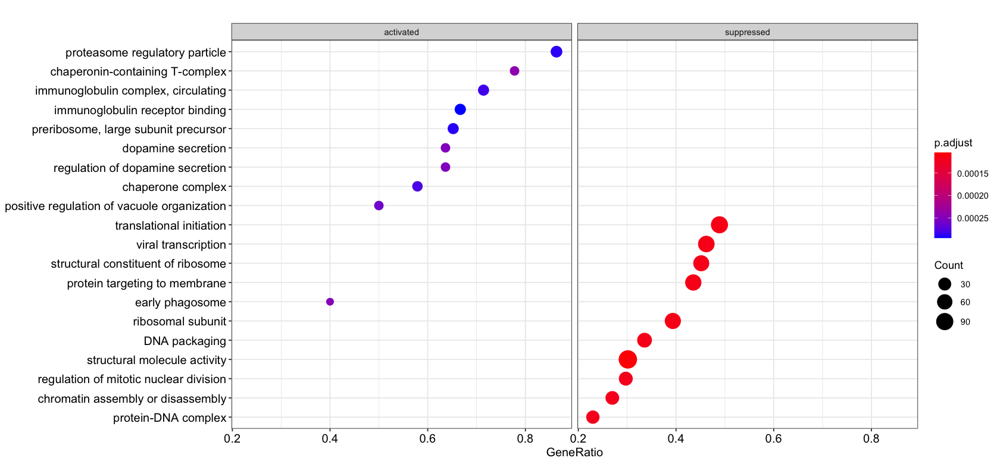

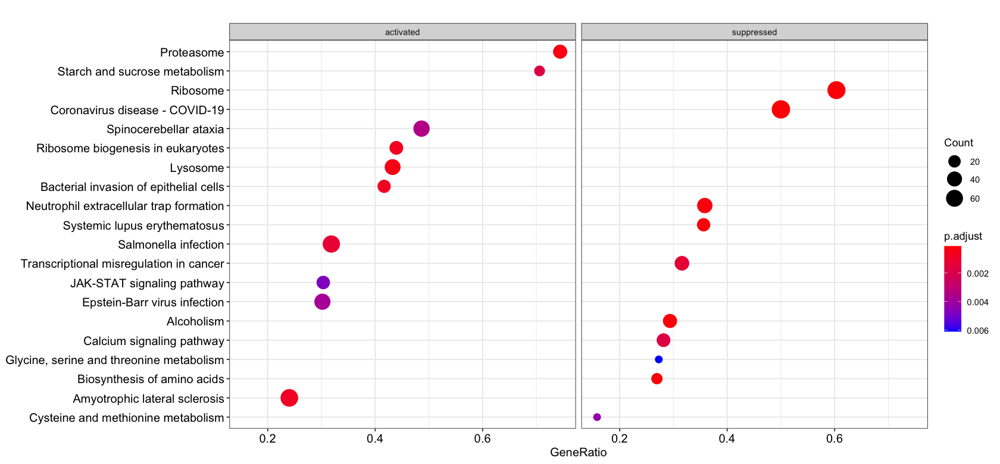

In [49]:
# plot the most significant pathways
dotplot(gse, showCategory=10, split=".sign") + facet_grid(.~.sign)
dotplot(kk2, showCategory=10, split=".sign") + facet_grid(.~.sign)

Picking joint bandwidth of 0.297



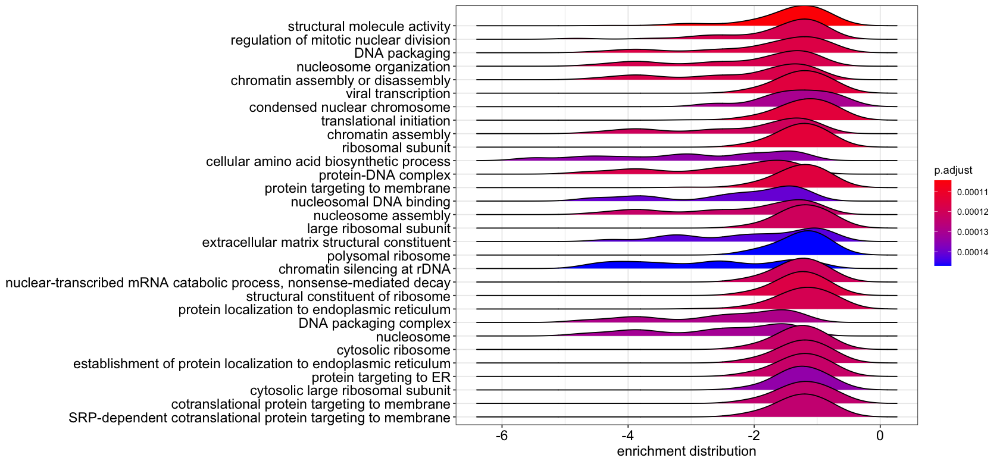

In [50]:
#as.data.frame(gse)
ridgeplot(gse) + labs(x = "enrichment distribution")

In [51]:
#gse_BP[gse_BP$NES>0,]

In [52]:
# quick keywords search
keywords
for (k in keywords) {
    print(k)
    print(grep(k, kk2$Description, ignore.case = TRUE))
    print(kk2$Description[grep(k, kk2$Description, ignore.case = TRUE)])
}

[1] "survival"       "death"          "cytoskeleton"   "cytokine"      
[5] "chemokine"      "adhesion"       "immunoglobulin"

[1] "survival"
integer(0)
character(0)
[1] "death"
integer(0)
character(0)
[1] "cytoskeleton"
integer(0)
character(0)
[1] "cytokine"
[1] 56
[1] "Adipocytokine signaling pathway"
[1] "chemokine"
integer(0)
character(0)
[1] "adhesion"
integer(0)
character(0)
[1] "immunoglobulin"
integer(0)
character(0)


In [70]:
write.xlsx(x = gse@result, file = paste('./GSEA/GSEA_GO_clusterProfiler_',names(dgeResults)[i],'.xlsx', sep=''), asTable = TRUE)

In [53]:
keywords
for (k in keywords) {
    print(k)
    print(grep(k, gse$Description, ignore.case = TRUE))
    print(gse$Description[grep(k, gse$Description, ignore.case = TRUE)])
}

[1] "survival"       "death"          "cytoskeleton"   "cytokine"      
[5] "chemokine"      "adhesion"       "immunoglobulin"

[1] "survival"
integer(0)
character(0)
[1] "death"
[1]  476  697 1279
[1] "negative regulation of hydrogen peroxide-mediated programmed cell death"
[2] "positive regulation of cell death"                                      
[3] "positive regulation of programmed cell death"                           
[1] "cytoskeleton"
[1]  368 1110 1197 1558 1646
[1] "microtubule cytoskeleton organization"                    
[2] "microtubule cytoskeleton organization involved in mitosis"
[3] "structural constituent of cytoskeleton"                   
[4] "postsynaptic cytoskeleton"                                
[5] "intermediate filament cytoskeleton"                       
[1] "cytokine"
 [1]  473  565  810  853 1052 1064 1088 1089 1177 1552 1553 1566 1619
 [1] "cytokine-mediated signaling pathway"                                         
 [2] "positive regulation of cytokine biosynthetic process"                        
 [3] "cellular response to cytokine stimulus"                              

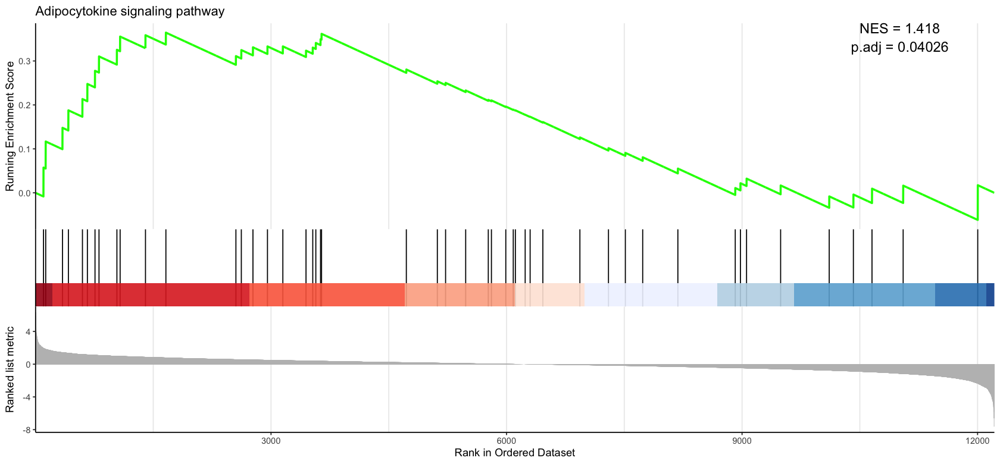

In [74]:
#plots
#hsa04920
entry = 'hsa04920'
label_padj = paste("p.adj =", signif(kk2@result[entry,]$p.adjust, digits = 4))
label_NES = paste("NES =", signif(kk2@result[entry,]$NES, digits = 4))
g = gseaplot2(kk2, title = kk2$Description[grep(entry, row.names(kk2@result))], geneSetID = entry) + 
annotate("text", x = 0.9, y = 0.9, label = label_padj, size = 5) +
annotate("text", x = 0.9, y = 0.94, label = label_NES, size = 5)
g

,ONTOLOGY,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalues,rank,leading_edge,core_enrichment
,<fct>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
GO:0042571,CC,GO:0042571,"immunoglobulin complex, circulating",21,0.8220585,2.622797,0.0002829655,0.0002829655,0.05699788,471,"tags=71%, list=3%, signal=69%",IGLL5/IGHG2/IGHG3/IGKC/IGHG1/IGHV1-69D/IGHV1-69/JCHAIN/IGHV4-61/IGHV4-34/IGHM/IGHV4-59/IGHV1-69-2/IGHA1/IGHA2


pdf 
  2

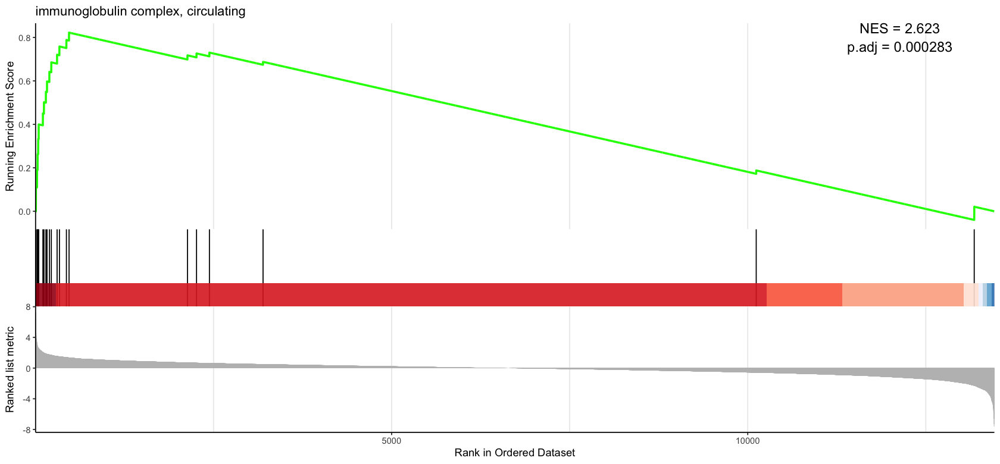

In [75]:
#gse@result[gse@result$NES >0,]
entry = 'GO:0042571'
gse@result[entry,]
label_padj = paste("p.adj =", signif(gse@result[entry,]$p.adjust, digits = 4))
label_NES = paste("NES =", signif(gse@result[entry,]$NES, digits = 4))
g = gseaplot2(gse, title = gse$Description[grep(entry, row.names(gse@result))], geneSetID = entry) + 
annotate("text", x = 0.9, y = 0.9, label = label_padj, size = 5) +
annotate("text", x = 0.9, y = 0.94, label = label_NES, size = 5)
g

pdf('GSEA_plot_GO:0042571.pdf', width = 16, height = 9)
print(gseaplot2(gse, title = gse$Description[grep(entry, row.names(gse@result))], geneSetID = entry) + 
annotate("text", x = 0.9, y = 0.9, label = label_padj, size = 5) +
annotate("text", x = 0.9, y = 0.94, label = label_NES, size = 5))
dev.off()

,ONTOLOGY,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalues,rank,leading_edge,core_enrichment
,<fct>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
GO:0042571,CC,GO:0042571,"immunoglobulin complex, circulating",21,0.8220585,2.622797,0.0002829655,0.0002829655,0.05699788,471,"tags=71%, list=3%, signal=69%",IGLL5/IGHG2/IGHG3/IGKC/IGHG1/IGHV1-69D/IGHV1-69/JCHAIN/IGHV4-61/IGHV4-34/IGHM/IGHV4-59/IGHV1-69-2/IGHA1/IGHA2


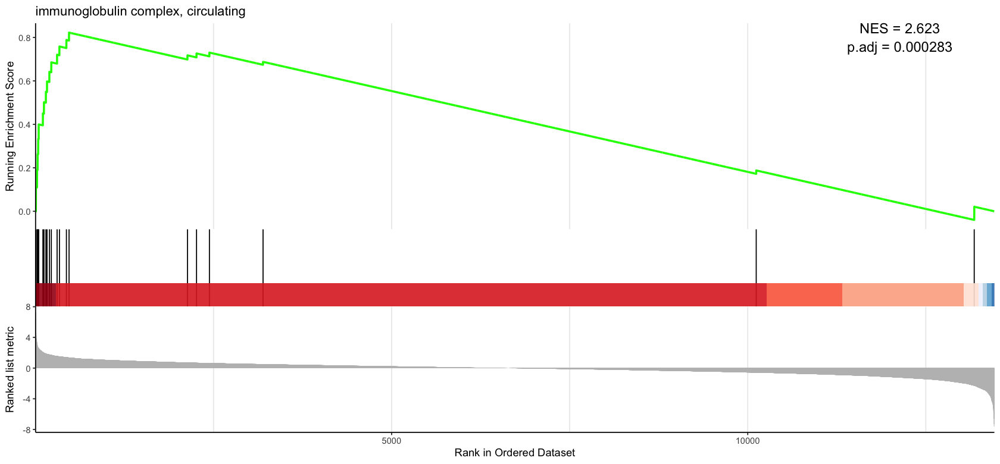

In [76]:
# GO:0042571
entry = 'GO:0042571'
gse@result[entry,]
label_padj = paste("p.adj =", signif(gse@result[entry,]$p.adjust, digits = 4))
label_NES = paste("NES =", signif(gse@result[entry,]$NES, digits = 4))
g = gseaplot2(gse, title = gse$Description[grep(entry, row.names(gse@result))], geneSetID = entry) + 
annotate("text", x = 0.9, y = 0.9, label = label_padj, size = 5) +
annotate("text", x = 0.9, y = 0.94, label = label_NES, size = 5)
g

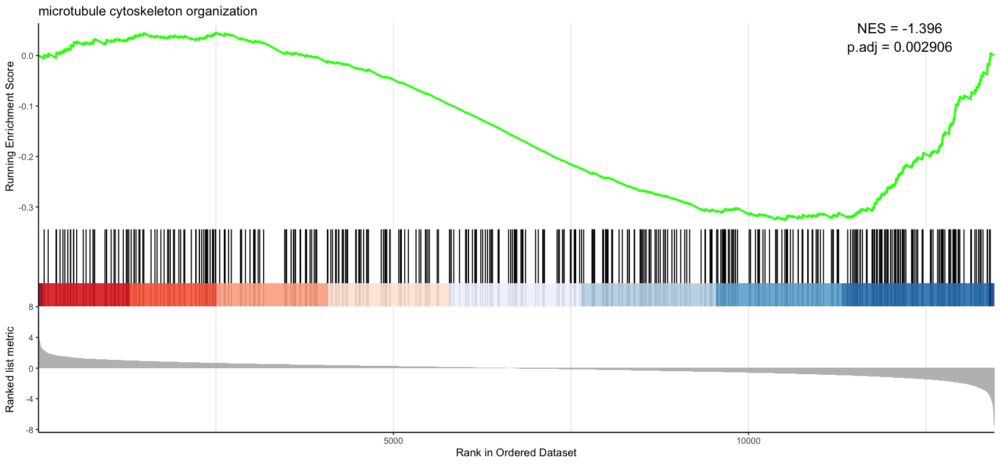

In [77]:
# GO:0000226 - entry 307
entry = 'GO:0000226'
label_padj = paste("p.adj =", signif(gse@result[entry,]$p.adjust, digits = 4))
label_NES = paste("NES =", signif(gse@result[entry,]$NES, digits = 4))
g = gseaplot2(gse, title = gse$Description[grep(entry, row.names(gse@result))], geneSetID = entry) + 
annotate("text", x = 0.9, y = 0.9, label = label_padj, size = 5) +
annotate("text", x = 0.9, y = 0.94, label = label_NES, size = 5)
g

In [79]:
# visualize pathway
browseKEGG(kk2, 'hsa04920')

In [72]:
############ save workspace ###############
save.image(file = paste(prj,".RData", sep=''))

In [84]:
BiocManager::install("celldex")


Warning message in `>.POSIXt`(file.mtime(dest), file.mtime(lib)):
“restarting interrupted promise evaluation”
Warning message in `>.POSIXt`(file.mtime(dest), file.mtime(lib)):
“internal error -3 in R_decompress1”


ERROR: Error in `>.POSIXt`(file.mtime(dest), file.mtime(lib)): lazy-load database '/Library/Frameworks/R.framework/Versions/3.6/Resources/library/lubridate/R/lubridate.rdb' is corrupt
